## 08 CHP Density, Micro-holes, and COL6 Dark Zone Segmentation

**What this notebook does:**  
Computes CHP density maps and segments COL6-dark zones in RA/OA synovial tissue.

**sv.tl functions demonstrated:**
- `sv.tl.detect_tissue_regions_dbscan` — robust tissue/background separation
- `sv.tl.filter_ecm_cell_inputs_by_tissue` — restrict cells, fibers, and links to tissue
- `sv.tl.score_col6_dark_neighborhoods` — annotate ECM-cell neighborhoods as COL6-dark

**Custom (notebook-level) code:** CHP density raster, micro-hole calling (not yet in sv.tl — research-stage parameters need tuning before package inclusion)

**Run before:** `08_RA_OA_ECM_cell_00_prepare_links.ipynb`  
**Run before:** `09_RA_OA_ECM_cell_spatioev_module_paper_applications.ipynb`


In [1]:
from pathlib import Path
# DATA AVAILABILITY CHECK
import os
# CHP density analysis requires RA/OA link results
_project_root = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
_results_dir = _project_root / "notebooks" / "results" / "ra_oa_ecm_cell"
_required_files = [_results_dir]
_missing = [f for f in _required_files if not os.path.exists(f)]
if _missing:
    print(f'Missing required data files: {_missing}')
    print('   This notebook requires real experimental data to run.')
    print('   The code is shown for reference.')
else:
    print('All required data files found. Notebook is ready to run.')


All required data files found. Notebook is ready to run.


# CHP-density micro-hole COL6A1-dark-zone segmentation

This notebook tests the simplest possible CHP-only definition of COL6A1-dark zones: **tiny tissue-internal holes with low smoothed CHP density**.

This version intentionally does **not** bridge neighboring CHP rings or build a support envelope. It uses:

1. a higher-resolution spatial grid;
2. a lightly smoothed CHP-density field;
3. direct low-CHP thresholding inside the tissue mask;
4. small-object filtering only, so micro-holes can remain separated.

COL6A1 is not used for segmentation. It is summarized afterward as validation.


In [2]:
from pathlib import Path
import os
import warnings

PROJECT_ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
RESULTS_DIR = PROJECT_ROOT / "notebooks" / "results" / "ra_oa_ecm_cell"
ANALYSIS_DIR = RESULTS_DIR / "chp_density_micro_holes_col6_dark_segmentation"
FIGURES_DIR = ANALYSIS_DIR / "figures"
OUTPUT_DIR = ANALYSIS_DIR / "outputs"
FIGURES_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

MPLCONFIG_DIR = ANALYSIS_DIR / ".mplconfig"
NUMBA_CACHE_DIR = ANALYSIS_DIR / ".numba_cache"
MPLCONFIG_DIR.mkdir(parents=True, exist_ok=True)
NUMBA_CACHE_DIR.mkdir(parents=True, exist_ok=True)
os.environ.setdefault("MPLCONFIGDIR", str(MPLCONFIG_DIR))
os.environ.setdefault("NUMBA_CACHE_DIR", str(NUMBA_CACHE_DIR))
os.environ.setdefault("LOKY_MAX_CPU_COUNT", "8")

import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display
from scipy.ndimage import binary_closing, binary_dilation, binary_fill_holes, binary_opening, distance_transform_edt, gaussian_filter, uniform_filter
from skimage.measure import find_contours, label, regionprops
from skimage.morphology import disk, remove_small_objects

sns.set_theme(style="white", context="notebook")
import spatioev as sv
from spatioev.tl import (
    detect_tissue_regions_dbscan,
    filter_ecm_cell_inputs_by_tissue,
    score_col6_dark_neighborhoods,
    build_ecm_cell_neighborhood_features,
    cluster_ecm_cell_neighborhoods,
)

# ── Nature/Cell publication rcParams ─────────────────────────────────────────
import matplotlib as mpl
_pub_rc = {
    "font.family": "sans-serif", "font.sans-serif": ["Arial","Helvetica","DejaVu Sans"],
    "font.size": 7, "axes.titlesize": 8, "axes.labelsize": 7,
    "xtick.labelsize": 6, "ytick.labelsize": 6, "legend.fontsize": 6,
    "axes.linewidth": 0.6, "xtick.major.width": 0.6, "ytick.major.width": 0.6,
    "xtick.major.size": 2.5, "ytick.major.size": 2.5,
    "axes.spines.top": False, "axes.spines.right": False,
    "axes.facecolor": "white", "figure.facecolor": "white",
    "savefig.dpi": 300, "savefig.bbox": "tight",
    "pdf.fonttype": 42, "ps.fonttype": 42,
}
mpl.rcParams.update(_pub_rc)

pd.set_option("display.max_columns", 160)



print("Project root:", PROJECT_ROOT)
print("Analysis outputs:", ANALYSIS_DIR)

Project root: /Users/shihongwu/SpatioEv
Analysis outputs: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation


## Load data

Inputs are the RA/OA cell table, fiber table, and existing cell-fiber links. The segmentation itself does not require `links_df`, but we use the same tissue cleanup style as the other ECM-cell notebooks so analyses stay comparable.

In [3]:
DATA_DIR = PROJECT_ROOT / "data" / "RA_OA"
ADATA_PATH = DATA_DIR / "tmp6.h5ad"
FIBER_PATH = RESULTS_DIR / "ra_oa_fiber_df.pkl"
LINKS_PATH = RESULTS_DIR / "ra_oa_cell_fiber_links.pkl"

# [reason] sv.load_h5ad handles backed reads and version checks
adata = sv.load_h5ad(ADATA_PATH)
fiber_df = pd.read_pickle(FIBER_PATH)
links_df = pd.read_pickle(LINKS_PATH)

IMAGE_KEY = "imageid"
GROUP_KEY = "pathology"
PHENOTYPE_KEY = "phenotype"
FIBER_TYPE_KEY = "fiber_type"
X_KEY = "X_centroid"
Y_KEY = "Y_centroid"
PIXEL_SIZE_UM = 0.325

print("Cells:", adata.shape)
print("Fibers:", fiber_df.shape)
print("Links:", links_df.shape)
print("Images:", sorted(adata.obs[IMAGE_KEY].unique()))

display(adata.obs[[IMAGE_KEY, GROUP_KEY, PHENOTYPE_KEY]].value_counts().reset_index(name="n_cells").head())
display(fiber_df.groupby([IMAGE_KEY, GROUP_KEY, FIBER_TYPE_KEY], observed=True).size().reset_index(name="n_fibers"))

Cells: (662388, 28)
Fibers: (548442, 14)
Links: (22495433, 4)
Images: ['JRP112', 'JRP122', 'JRP141', 'JRP144', 'S00292623', 'S00293087']


,imageid,pathology,phenotype,n_cells
0,JRP141,RA,Non-immune cells,75694
1,S00292623,OA,Monocytes,61147
2,S00292623,OA,Non-immune cells,59069
3,S00293087,OA,Non-immune cells,41462
4,JRP122,RA,Non-immune cells,34129


,imageid,pathology,fiber_type,n_fibers
0,JRP112,RA,CHP,2727
1,JRP112,RA,COL1A1bis,6085
2,JRP112,RA,COL4A1,1313
3,JRP112,RA,COL6A1,8053
4,JRP112,RA,FN,7843
5,JRP112,RA,MFAP5,3717
6,JRP122,RA,CHP,6262
7,JRP122,RA,COL1A1bis,2683
8,JRP122,RA,COL4A1,904
9,JRP122,RA,COL6A1,10614


## Parameters

Micro-hole tuning guide:

- `GRID_RESOLUTION_UM`: smaller values preserve smaller holes. This notebook uses a finer grid than the previous 8 um versions.
- `DENSITY_METHOD`: `"local_radius"` first calculates local CHP density within a local sliding window around each grid pixel, then smooths that density. This is usually more interpretable than directly blurring CHP centroids.
- `LOCAL_DENSITY_RADIUS_UM`: radius used for local CHP density. Smaller values preserve tiny holes; larger values merge nearby low-density gaps.
- `DENSITY_SIGMA_UM`: light smoothing applied after local density is calculated. Keep this smaller than the local-density radius.
- `CHP_LOW_DENSITY_RANK_CUTOFF`: pixels below this CHP-density percentile are candidate holes. Increase to call more holes.
- `MICRO_HOLE_MIN_AREA_UM2`: minimum hole area to keep. Lower keeps tiny holes but may keep noise.
- `MICRO_HOLE_MAX_AREA_UM2`: optional maximum hole area. Use this to keep micro-holes while excluding broad low-CHP regions.
- `MICRO_HOLE_OPENING_UM` / `MICRO_HOLE_CLOSING_UM`: set to 0 by default to avoid connecting neighboring holes.
- `TISSUE_EDGE_EXCLUSION_UM`: excludes tissue-edge artifacts while keeping internal holes.
- `EDGE_WIDTH_UM`: width of inner/outer bands for downstream density summaries. For tiny holes this is smaller than the previous 30 um setting.

Start with `RUN_IMAGES = ["JRP112"]` for QC. Set `RUN_IMAGES = None` after the micro-hole calls look reasonable.


In [4]:
# Use ["JRP112"] for fast QC. Set RUN_IMAGES=None and QC_IMAGES=None to process and plot all samples.
RUN_IMAGES = None
QC_IMAGES = None

# CHP is the only segmentation input. COL6A1 is kept for post-hoc validation summaries.
SEGMENTATION_FIBER_TYPE = "CHP"
FIBER_TYPES = ["COL6A1", "CHP"]

# Higher-resolution grid for tiny holes. This is 2x finer than the earlier 8 um grid.
GRID_RESOLUTION_UM = 4.0
GRID_RESOLUTION_PX = GRID_RESOLUTION_UM / PIXEL_SIZE_UM

# Build a local CHP-density field first, then smooth it lightly.
# This is more interpretable than directly Gaussian-blurring sparse fiber centroids.
DENSITY_METHOD = "local_radius"  # options: "local_radius", "gaussian"
LOCAL_DENSITY_RADIUS_UM = 24.0
DENSITY_SIGMA_UM = 4.0
LOCAL_DENSITY_RADIUS_GRID = LOCAL_DENSITY_RADIUS_UM / GRID_RESOLUTION_UM
DENSITY_SIGMA_GRID = DENSITY_SIGMA_UM / GRID_RESOLUTION_UM

# Tissue mask parameters. Tissue detection is still cell-based, but hole calling is CHP-density-only.
CLEAN_TISSUE_BEFORE_ANALYSIS = True
TISSUE_DBSCAN_EPS_UM = 65
TISSUE_DBSCAN_EPS_PX = TISSUE_DBSCAN_EPS_UM / PIXEL_SIZE_UM
TISSUE_DBSCAN_MIN_SAMPLES = 50
TISSUE_MIN_CELLS = 1600
TISSUE_MASK_SIGMA_UM = 16.0
TISSUE_MASK_SIGMA_GRID = TISSUE_MASK_SIGMA_UM / GRID_RESOLUTION_UM
TISSUE_RELATIVE_THRESHOLD = 0.03
TISSUE_CLOSING_UM = 16.0
TISSUE_MIN_AREA_UM2 = 20000.0
TISSUE_EDGE_EXCLUSION_UM = 4.0

# Direct CHP-density micro-hole parameters. No support-envelope bridging is used.
CHP_LOW_DENSITY_RANK_CUTOFF = 0.33
MICRO_HOLE_MIN_AREA_UM2 = 64.0
MICRO_HOLE_MAX_AREA_UM2 = None
MICRO_HOLE_OPENING_UM = 0.0
MICRO_HOLE_CLOSING_UM = 0.0
MICRO_HOLE_FILL_HOLES = False

# Edge-band width for small-hole measurements.
EDGE_WIDTH_UM = 8.0

# Fiber weights used for density quantification in region summaries.
FIBER_AREA_COL = "area"
FIBER_LENGTH_COL = "major_axis_length"

print("Grid resolution px:", GRID_RESOLUTION_PX)
print("Density method:", DENSITY_METHOD)
print("Local density radius grid:", LOCAL_DENSITY_RADIUS_GRID)
print("Post-density smoothing sigma grid:", DENSITY_SIGMA_GRID)
print("Run images:", RUN_IMAGES)
print("Segmentation input:", SEGMENTATION_FIBER_TYPE)
print("Summary fibers:", FIBER_TYPES)



Grid resolution px: 12.307692307692307
Density method: local_radius
Local density radius grid: 6.0
Post-density smoothing sigma grid: 1.0
Run images: None
Segmentation input: CHP
Summary fibers: ['COL6A1', 'CHP']


## Tissue cleanup

This mirrors the prior GeoMx-style cleanup: DBSCAN identifies tissue pieces from cells, removes DBSCAN noise and small fragments, then the density segmentation is performed only on retained cells and linked fibers.

In [5]:
# ── Tissue mask computation ─────────────────────────────────────────────────
# [reason] DBSCAN on cell positions identifies tissue regions; small fragments
# (< TISSUE_MIN_CELLS) and edge-boundary regions are excluded before hole calling.
if RUN_IMAGES is None:
    adata_selected = adata
    fiber_selected = fiber_df
    links_selected = links_df
else:
    run_images = list(RUN_IMAGES)
    adata_selected = adata[adata.obs[IMAGE_KEY].isin(run_images)].copy()
    fiber_selected = fiber_df[fiber_df[IMAGE_KEY].isin(run_images)].copy()
    links_selected = links_df[links_df[IMAGE_KEY].isin(run_images)].copy()

if CLEAN_TISSUE_BEFORE_ANALYSIS:
    tissue_df, tissue_summary = detect_tissue_regions_dbscan(
        adata_selected,
        eps=TISSUE_DBSCAN_EPS_PX,
        min_samples=TISSUE_DBSCAN_MIN_SAMPLES,
        min_cells=TISSUE_MIN_CELLS,
        image_key=IMAGE_KEY,
        x_key=X_KEY,
        y_key=Y_KEY,
        cluster_key="tissue_region",
        keep_key="keep_tissue",
    )
    adata_run, fiber_run, links_run = filter_ecm_cell_inputs_by_tissue(
        adata_selected,
        fiber_selected,
        links_selected,
        tissue_df,
        keep_key="keep_tissue",
    )
else:
    tissue_df = pd.DataFrame()
    tissue_summary = pd.DataFrame()
    adata_run = adata_selected
    fiber_run = fiber_selected
    links_run = links_selected

print("Selected cells:", adata_selected.n_obs)
print("Cleaned cells:", adata_run.n_obs)
print("Selected fibers:", len(fiber_selected))
print("Cleaned linked fibers:", len(fiber_run))
print("Selected links:", len(links_selected))
print("Cleaned links:", len(links_run))

if not tissue_summary.empty:
    tissue_summary.to_csv(OUTPUT_DIR / "00_tissue_cleanup_component_summary.csv", index=False)
    display(tissue_summary.sort_values([IMAGE_KEY, "kept", "n_cells"], ascending=[True, False, False]).head(30))

Selected cells: 662388
Cleaned cells: 516185
Selected fibers: 548442
Cleaned linked fibers: 368568
Selected links: 22495433
Cleaned links: 18128337


,imageid,dbscan_label,n_cells,kept
0,JRP112,2,46279,True
1,JRP112,3,3855,True
2,JRP112,4,2895,True
3,JRP112,-1,408,False
4,JRP112,1,331,False
5,JRP112,0,216,False
6,JRP122,0,62954,True
7,JRP122,8,2579,True
8,JRP122,-1,1636,False
9,JRP122,1,1013,False


## Filter inputs to tissue region

`sv.tl.filter_ecm_cell_inputs_by_tissue` restricts cells, fibers, and links
to cells that DBSCAN identified as belonging to tissue (excluding background and
small debris fragments). This ensures all downstream ECM-cell analyses operate
on the same tissue-masked inputs.


In [6]:
# ── Filter cells, fibers, and links to tissue ────────────────────────────────
# [reason] sv.tl.filter_ecm_cell_inputs_by_tissue propagates the tissue mask
# to fibers and links so that all three inputs stay consistent — fibers linked
# to out-of-tissue cells are removed automatically.
tissue_df_filtered = tissue_df if not tissue_df.empty else adata_selected.obs.copy()
if "keep_tissue" not in tissue_df_filtered.columns:
    tissue_df_filtered["keep_tissue"] = True   # no DBSCAN cleanup → keep all

adata_tissue, fiber_tissue, links_tissue = filter_ecm_cell_inputs_by_tissue(
    adata_selected,
    fiber_selected,
    links_selected,
    tissue_df=tissue_df_filtered,
    keep_key="keep_tissue",
)
print(f"After tissue filter: {adata_tissue.n_obs} cells, {len(fiber_tissue)} fibers, {len(links_tissue)} links")
print(f"Removed: {adata_selected.n_obs - adata_tissue.n_obs} cells, "
      f"{len(fiber_selected) - len(fiber_tissue)} fibers")


After tissue filter: 516185 cells, 368568 fibers, 18128337 links
Removed: 146203 cells, 179874 fibers


## Raster helpers and direct CHP-density micro-hole segmentation

The key function is `compute_dark_score_and_mask`. It now does only this:

`CHP_density_rank <= CHP_LOW_DENSITY_RANK_CUTOFF` inside the tissue mask

The CHP density field is now a local-radius density map followed by light smoothing, not a direct blur of sparse centroids. There is still no CHP-support envelope and no ring-bridging step. The score is simply `1 - CHP_density_rank`, which is useful for QC but not a multi-feature model.


In [7]:
def _radius_to_grid_cells(radius_um, grid_resolution_um=GRID_RESOLUTION_UM):
    return max(1, int(np.ceil(radius_um / grid_resolution_um)))


def _disk(radius_um, grid_resolution_um=GRID_RESOLUTION_UM):
    return disk(_radius_to_grid_cells(radius_um, grid_resolution_um))


def make_grid_bounds(cell_df, fiber_df=None, pad_um=80.0):
    pad_px = pad_um / PIXEL_SIZE_UM
    x_vals = [cell_df[X_KEY].to_numpy(dtype=float)]
    y_vals = [cell_df[Y_KEY].to_numpy(dtype=float)]
    if fiber_df is not None and not fiber_df.empty:
        x_vals.append(fiber_df[X_KEY].to_numpy(dtype=float))
        y_vals.append(fiber_df[Y_KEY].to_numpy(dtype=float))
    x_all = np.concatenate(x_vals)
    y_all = np.concatenate(y_vals)
    minx = np.nanmin(x_all) - pad_px
    maxx = np.nanmax(x_all) + pad_px
    miny = np.nanmin(y_all) - pad_px
    maxy = np.nanmax(y_all) + pad_px
    nx = int(np.ceil((maxx - minx) / GRID_RESOLUTION_PX)) + 1
    ny = int(np.ceil((maxy - miny) / GRID_RESOLUTION_PX)) + 1
    return {"minx": minx, "miny": miny, "maxx": maxx, "maxy": maxy, "nx": nx, "ny": ny}


def point_to_grid(x, y, bounds):
    col = np.floor((np.asarray(x, dtype=float) - bounds["minx"]) / GRID_RESOLUTION_PX).astype(int)
    row = np.floor((np.asarray(y, dtype=float) - bounds["miny"]) / GRID_RESOLUTION_PX).astype(int)
    valid = (
        np.isfinite(x)
        & np.isfinite(y)
        & (row >= 0)
        & (row < bounds["ny"])
        & (col >= 0)
        & (col < bounds["nx"])
    )
    return row, col, valid


def rasterize_points(df, bounds, weight=None):
    grid = np.zeros((bounds["ny"], bounds["nx"]), dtype=float)
    if df.empty:
        return grid
    row, col, valid = point_to_grid(df[X_KEY].to_numpy(), df[Y_KEY].to_numpy(), bounds)
    if weight is None:
        values = np.ones(len(df), dtype=float)
    else:
        values = np.asarray(weight, dtype=float)
        values = np.nan_to_num(values, nan=0.0, posinf=0.0, neginf=0.0)
    np.add.at(grid, (row[valid], col[valid]), values[valid])
    return grid


def local_density_from_raw(raw_grid, radius_um=LOCAL_DENSITY_RADIUS_UM, smooth_sigma_grid=DENSITY_SIGMA_GRID):
    """
    Convert a rasterized fiber grid into a local density field.

    `local_radius` counts nearby fiber signal inside a square sliding window
    around each grid pixel, normalizes by window area, then lightly smooths
    the local-density field.
    This avoids making long fibers look like isolated blurred centroid dots.
    """
    raw_grid = np.asarray(raw_grid, dtype=float)

    if DENSITY_METHOD == "gaussian":
        return gaussian_filter(raw_grid, sigma=smooth_sigma_grid)

    if DENSITY_METHOD != "local_radius":
        raise ValueError("DENSITY_METHOD must be 'local_radius' or 'gaussian'")

    window = 2 * _radius_to_grid_cells(radius_um) + 1
    window_area_um2 = (window * GRID_RESOLUTION_UM) ** 2
    if window_area_um2 <= 0:
        return raw_grid.copy()

    # A square sliding window is much faster than disk convolution for large images,
    # and works well here because we only need a smooth local abundance field.
    density = uniform_filter(raw_grid, size=window, mode="constant", cval=0.0) * (window ** 2) / window_area_um2
    if smooth_sigma_grid and smooth_sigma_grid > 0:
        density = gaussian_filter(density, sigma=smooth_sigma_grid)
    return density


def percentile_rank_in_mask(values, mask, ascending=True):
    out = np.full(values.shape, np.nan, dtype=float)
    vals = np.asarray(values[mask], dtype=float)
    if vals.size == 0:
        return out
    ranks = pd.Series(vals).rank(method="average", pct=True, ascending=ascending).to_numpy(dtype=float)
    out[mask] = ranks
    return out


def cleanup_binary_mask(mask, min_area_um2=0.0, opening_um=0.0, closing_um=0.0, fill_holes=True):
    out = mask.astype(bool).copy()
    if opening_um and opening_um > 0:
        out = binary_opening(out, structure=_disk(opening_um))
    if closing_um and closing_um > 0:
        out = binary_closing(out, structure=_disk(closing_um))
    if fill_holes:
        out = binary_fill_holes(out)
    min_pixels = int(np.ceil(min_area_um2 / (GRID_RESOLUTION_UM ** 2)))
    if min_pixels > 1:
        out = remove_small_objects(out, min_size=min_pixels)
    return out.astype(bool)


def build_density_maps(cell_df, fiber_df):
    bounds = make_grid_bounds(cell_df, fiber_df)

    cell_count_raw = rasterize_points(cell_df, bounds)
    cell_density = gaussian_filter(cell_count_raw, sigma=TISSUE_MASK_SIGMA_GRID)
    tissue_threshold = cell_density.max() * TISSUE_RELATIVE_THRESHOLD if cell_density.max() > 0 else np.inf
    tissue_mask = cell_density >= tissue_threshold
    tissue_mask = cleanup_binary_mask(
        tissue_mask,
        min_area_um2=TISSUE_MIN_AREA_UM2,
        closing_um=TISSUE_CLOSING_UM,
        fill_holes=True,
    )

    maps = {
        "bounds": bounds,
        "cell_count_raw": cell_count_raw,
        "cell_density": cell_density,
        "tissue_mask": tissue_mask,
    }

    for fiber_type in FIBER_TYPES:
        sub = fiber_df[fiber_df[FIBER_TYPE_KEY].eq(fiber_type)].copy()
        count_raw = rasterize_points(sub, bounds)
        maps[f"{fiber_type}_count_raw"] = count_raw
        if fiber_type == SEGMENTATION_FIBER_TYPE:
            maps[f"{fiber_type}_density"] = local_density_from_raw(count_raw)
        else:
            maps[f"{fiber_type}_density"] = gaussian_filter(count_raw, sigma=DENSITY_SIGMA_GRID)

        if FIBER_AREA_COL in sub.columns:
            area_um2 = sub[FIBER_AREA_COL].to_numpy(dtype=float) * (PIXEL_SIZE_UM ** 2)
        else:
            area_um2 = np.ones(len(sub), dtype=float)
        maps[f"{fiber_type}_area_um2_raw"] = rasterize_points(sub, bounds, weight=area_um2)
        maps[f"{fiber_type}_area_density"] = gaussian_filter(maps[f"{fiber_type}_area_um2_raw"], sigma=DENSITY_SIGMA_GRID)

        if FIBER_LENGTH_COL in sub.columns:
            length_um = sub[FIBER_LENGTH_COL].to_numpy(dtype=float) * PIXEL_SIZE_UM
        else:
            length_um = np.ones(len(sub), dtype=float)
        maps[f"{fiber_type}_length_um_raw"] = rasterize_points(sub, bounds, weight=length_um)
        maps[f"{fiber_type}_length_density"] = gaussian_filter(maps[f"{fiber_type}_length_um_raw"], sigma=DENSITY_SIGMA_GRID)

    return maps


def compute_dark_score_and_mask(maps):
    tissue_mask = maps["tissue_mask"]
    chp = maps[f"{SEGMENTATION_FIBER_TYPE}_density"]

    chp_rank = percentile_rank_in_mask(chp, tissue_mask, ascending=True)
    low_chp = 1.0 - chp_rank
    dark_score = np.nan_to_num(low_chp, nan=0.0, posinf=0.0, neginf=0.0)

    distance_to_tissue_edge_um = distance_transform_edt(tissue_mask, sampling=GRID_RESOLUTION_UM)
    tissue_interior = tissue_mask & (distance_to_tissue_edge_um >= TISSUE_EDGE_EXCLUSION_UM)

    dark_mask = tissue_interior & (chp_rank <= CHP_LOW_DENSITY_RANK_CUTOFF)
    dark_mask = cleanup_binary_mask(
        dark_mask,
        min_area_um2=MICRO_HOLE_MIN_AREA_UM2,
        opening_um=MICRO_HOLE_OPENING_UM,
        closing_um=MICRO_HOLE_CLOSING_UM,
        fill_holes=MICRO_HOLE_FILL_HOLES,
    )
    dark_mask = dark_mask & tissue_interior

    if MICRO_HOLE_MAX_AREA_UM2 is not None:
        labels = label(dark_mask, connectivity=2)
        filtered = np.zeros_like(dark_mask, dtype=bool)
        for prop in regionprops(labels):
            area_um2 = prop.area * (GRID_RESOLUTION_UM ** 2)
            if area_um2 <= MICRO_HOLE_MAX_AREA_UM2:
                filtered[labels == prop.label] = True
        dark_mask = filtered

    maps["CHP_density_rank"] = chp_rank
    maps["low_CHP_score"] = low_chp
    maps["distance_to_tissue_edge_um"] = distance_to_tissue_edge_um
    maps["COL6_dark_score"] = dark_score
    maps["COL6_dark_mask"] = dark_mask
    maps["COL6_dark_component"] = label(dark_mask, connectivity=2)
    return maps


def make_region_masks_for_component(dark_mask, component_mask, tissue_mask):
    inside_distance = distance_transform_edt(component_mask, sampling=GRID_RESOLUTION_UM)
    outside_distance = distance_transform_edt(~component_mask, sampling=GRID_RESOLUTION_UM)

    core = component_mask & (inside_distance > EDGE_WIDTH_UM)
    inner_edge = component_mask & ~core
    outer_edge = tissue_mask & ~dark_mask & (outside_distance <= EDGE_WIDTH_UM)
    full_edge = inner_edge | outer_edge
    background = tissue_mask & ~dark_mask & ~outer_edge
    return {
        "core": core,
        "inner_edge": inner_edge,
        "outer_edge": outer_edge,
        "full_edge": full_edge,
        "background": background,
    }


def make_global_region_masks(dark_mask, tissue_mask):
    inside_distance = distance_transform_edt(dark_mask, sampling=GRID_RESOLUTION_UM)
    outside_distance = distance_transform_edt(~dark_mask, sampling=GRID_RESOLUTION_UM)
    core = dark_mask & (inside_distance > EDGE_WIDTH_UM)
    inner_edge = dark_mask & ~core
    outer_edge = tissue_mask & ~dark_mask & (outside_distance <= EDGE_WIDTH_UM)
    full_edge = inner_edge | outer_edge
    background = tissue_mask & ~dark_mask & ~outer_edge
    return {
        "core": core,
        "inner_edge": inner_edge,
        "outer_edge": outer_edge,
        "full_edge": full_edge,
        "background": background,
    }


def summarize_mask_region(mask, maps, image_id, pathology, component_id, region):
    pixel_area_um2 = GRID_RESOLUTION_UM ** 2
    area_um2 = float(mask.sum() * pixel_area_um2)
    row = {
        IMAGE_KEY: image_id,
        GROUP_KEY: pathology,
        "dark_component": component_id,
        "region": region,
        "area_um2": area_um2,
        "area_mm2": area_um2 / 1e6,
        "n_grid_pixels": int(mask.sum()),
        "cell_count": float(maps["cell_count_raw"][mask].sum()),
        "mean_cell_density_field": float(np.nanmean(maps["cell_density"][mask])) if mask.any() else np.nan,
        "mean_dark_score": float(np.nanmean(maps["COL6_dark_score"][mask])) if mask.any() else np.nan,
        "mean_CHP_density_rank": float(np.nanmean(maps["CHP_density_rank"][mask])) if mask.any() else np.nan,
        "mean_distance_to_tissue_edge_um": float(np.nanmean(maps["distance_to_tissue_edge_um"][mask])) if mask.any() else np.nan,
    }
    row["cell_density_per_mm2"] = row["cell_count"] / row["area_mm2"] if row["area_mm2"] > 0 else np.nan

    for fiber_type in FIBER_TYPES:
        count = float(maps[f"{fiber_type}_count_raw"][mask].sum())
        area_sum = float(maps[f"{fiber_type}_area_um2_raw"][mask].sum())
        length_sum = float(maps[f"{fiber_type}_length_um_raw"][mask].sum())
        row[f"{fiber_type}_fiber_count"] = count
        row[f"{fiber_type}_fiber_count_density_per_mm2"] = count / row["area_mm2"] if row["area_mm2"] > 0 else np.nan
        row[f"{fiber_type}_fiber_area_um2"] = area_sum
        row[f"{fiber_type}_fiber_area_fraction"] = area_sum / area_um2 if area_um2 > 0 else np.nan
        row[f"{fiber_type}_fiber_length_um"] = length_sum
        row[f"{fiber_type}_fiber_length_density_mm_per_mm2"] = length_sum * 1000 / area_um2 if area_um2 > 0 else np.nan
        row[f"{fiber_type}_mean_smoothed_count_density"] = float(np.nanmean(maps[f"{fiber_type}_density"][mask])) if mask.any() else np.nan
        row[f"{fiber_type}_mean_smoothed_area_density"] = float(np.nanmean(maps[f"{fiber_type}_area_density"][mask])) if mask.any() else np.nan
    return row


def summarize_dark_components(maps, image_id, pathology):
    dark_labels = maps["COL6_dark_component"]
    dark_mask = maps["COL6_dark_mask"]
    tissue_mask = maps["tissue_mask"]
    rows = []
    component_rows = []

    for prop in regionprops(dark_labels):
        component_id = int(prop.label)
        component_mask = dark_labels == component_id
        regions = make_region_masks_for_component(dark_mask, component_mask, tissue_mask)
        component_area_um2 = float(component_mask.sum() * GRID_RESOLUTION_UM ** 2)
        component_rows.append({
            IMAGE_KEY: image_id,
            GROUP_KEY: pathology,
            "dark_component": component_id,
            "area_um2": component_area_um2,
            "area_mm2": component_area_um2 / 1e6,
            "centroid_x": maps["bounds"]["minx"] + prop.centroid[1] * GRID_RESOLUTION_PX,
            "centroid_y": maps["bounds"]["miny"] + prop.centroid[0] * GRID_RESOLUTION_PX,
            "bbox_grid": prop.bbox,
        })
        for region, mask in regions.items():
            rows.append(summarize_mask_region(mask, maps, image_id, pathology, component_id, region))

    # Add image-level background if no components are found, so downstream code does not fail.
    if not rows:
        rows.append(summarize_mask_region(tissue_mask, maps, image_id, pathology, 0, "background"))

    return pd.DataFrame(component_rows), pd.DataFrame(rows)


def summarize_image_regions(maps, image_id, pathology):
    regions = make_global_region_masks(maps["COL6_dark_mask"], maps["tissue_mask"])
    rows = []
    for region, mask in regions.items():
        rows.append(summarize_mask_region(mask, maps, image_id, pathology, "all", region))
    return pd.DataFrame(rows)


def assign_cells_to_regions(cell_df, maps, image_id, pathology):
    bounds = maps["bounds"]
    dark_mask = maps["COL6_dark_mask"]
    tissue_mask = maps["tissue_mask"]
    dark_labels = maps["COL6_dark_component"]

    inside_distance = distance_transform_edt(dark_mask, sampling=GRID_RESOLUTION_UM)
    outside_distance, nearest_idx = distance_transform_edt(~dark_mask, sampling=GRID_RESOLUTION_UM, return_indices=True)

    core = dark_mask & (inside_distance > EDGE_WIDTH_UM)
    inner_edge = dark_mask & ~core
    outer_edge = tissue_mask & ~dark_mask & (outside_distance <= EDGE_WIDTH_UM)

    region_grid = np.full(dark_mask.shape, "outside_tissue", dtype=object)
    region_grid[tissue_mask] = "background"
    region_grid[outer_edge] = "outer_edge"
    region_grid[inner_edge] = "inner_edge"
    region_grid[core] = "core"

    nearest_component_grid = dark_labels[nearest_idx[0], nearest_idx[1]]
    component_grid = np.zeros(dark_mask.shape, dtype=int)
    component_grid[dark_mask] = dark_labels[dark_mask]
    component_grid[outer_edge] = nearest_component_grid[outer_edge]

    row, col, valid = point_to_grid(cell_df[X_KEY].to_numpy(), cell_df[Y_KEY].to_numpy(), bounds)
    assignments = cell_df[[IMAGE_KEY, GROUP_KEY, PHENOTYPE_KEY, X_KEY, Y_KEY]].copy()
    assignments["cell_id"] = assignments.index
    assignments["COL6_dark_region"] = "outside_grid"
    assignments["dark_component"] = 0
    assignments["COL6_dark_score"] = np.nan
    assignments["CHP_density_rank"] = np.nan
    assignments.loc[valid, "COL6_dark_region"] = region_grid[row[valid], col[valid]]
    assignments.loc[valid, "dark_component"] = component_grid[row[valid], col[valid]]
    assignments.loc[valid, "COL6_dark_score"] = maps["COL6_dark_score"][row[valid], col[valid]]
    assignments.loc[valid, "CHP_density_rank"] = maps["CHP_density_rank"][row[valid], col[valid]]
    return assignments


def plot_contours(ax, mask, bounds, color="black", linewidth=1.2, linestyle="-", label=None):
    contours = find_contours(mask.astype(float), 0.5)
    used_label = False
    for contour in contours:
        y = bounds["miny"] + contour[:, 0] * GRID_RESOLUTION_PX
        x = bounds["minx"] + contour[:, 1] * GRID_RESOLUTION_PX
        ax.plot(x, y, color=color, linewidth=linewidth, linestyle=linestyle, label=label if not used_label else None)
        used_label = True


def savefig(fig, filename):
    path = FIGURES_DIR / filename
    fig.savefig(path, dpi=250, bbox_inches="tight")
    print("Saved:", path)


def plot_density_qc(maps, image_id):
    bounds = maps["bounds"]
    extent = [bounds["minx"], bounds["maxx"], bounds["maxy"], bounds["miny"]]
    panels = [
        ("cell_density", "Cell density", "magma"),
        ("CHP_density", "Local CHP density", "viridis"),
        ("CHP_density_rank", "CHP density rank", "mako"),
        ("COL6_dark_score", "Low-CHP score", "Blues"),
    ]
    fig, axes = plt.subplots(2, 2, figsize=(12, 11), squeeze=False)
    for ax, (key, title, cmap) in zip(axes.ravel(), panels):
        im = ax.imshow(maps[key], extent=extent, cmap=cmap, interpolation="nearest")
        plot_contours(ax, maps["tissue_mask"], bounds, color="white", linewidth=0.8, linestyle="--", label="tissue")
        plot_contours(ax, maps["COL6_dark_mask"], bounds, color="black", linewidth=1.3, label="dark mask")
        ax.set_title(f"{image_id}: {title}")
        ax.set_aspect("equal", adjustable="box")
        ax.grid(False)
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    fig.tight_layout()
    savefig(fig, f"01_{image_id}_chp_micro_hole_density_rank_score.png")
    plt.show()
    return fig, axes


def plot_region_overlay(cell_df, fiber_df, assignments, maps, image_id, max_fibers=30000):
    bounds = maps["bounds"]
    cells = assignments[assignments[IMAGE_KEY].eq(image_id)].copy()
    fibers = fiber_df[fiber_df[IMAGE_KEY].eq(image_id) & fiber_df[FIBER_TYPE_KEY].isin(FIBER_TYPES)].copy()
    if len(fibers) > max_fibers:
        fibers = fibers.sample(max_fibers, random_state=0)

    palette = {
        "background": "lightgray",
        "outer_edge": "#d95f02",
        "inner_edge": "#1b9e77",
        "core": "#253494",
        "outside_tissue": "#eeeeee",
        "outside_grid": "#eeeeee",
    }

    fig, ax = plt.subplots(figsize=(10, 10))
    for region in ["background", "outer_edge", "inner_edge", "core"]:
        sub = cells[cells["COL6_dark_region"].eq(region)]
        ax.scatter(sub[X_KEY], sub[Y_KEY], s=3 if region == "background" else 8, color=palette[region], alpha=0.25 if region == "background" else 0.85, linewidth=0, label=region)

    col6 = fibers[fibers[FIBER_TYPE_KEY].eq("COL6A1")]
    chp = fibers[fibers[FIBER_TYPE_KEY].eq("CHP")]
    ax.scatter(col6[X_KEY], col6[Y_KEY], s=1, color="#c51b7d", alpha=0.16, linewidth=0, label="COL6A1 fibers")
    ax.scatter(chp[X_KEY], chp[Y_KEY], s=1, color="#1a9850", alpha=0.20, linewidth=0, label="CHP fibers")
    plot_contours(ax, maps["COL6_dark_mask"], bounds, color="black", linewidth=1.6, label="CHP micro-hole boundary")

    ax.set_title(f"{image_id}: CHP-density micro-hole core and edge bands")
    ax.set_aspect("equal", adjustable="box")
    ax.invert_yaxis()
    ax.grid(False)
    ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False, markerscale=4)
    sns.despine(ax=ax)
    fig.tight_layout()
    savefig(fig, f"02_{image_id}_chp_micro_hole_core_edge_overlay.png")
    plt.show()
    return fig, ax

## Run direct CHP-density micro-hole segmentation

This loop builds the high-resolution CHP density map per image, calls low-CHP micro-holes inside tissue, assigns cells to core/edge/background regions, and saves summary tables.


In [8]:
# ── Run CHP-density micro-hole segmentation ──────────────────────────────────
# [reason] For each image: build CHP density raster → smooth → threshold →
# label connected components → classify as core / inner_edge / outer_edge.
all_component_rows = []
all_region_rows = []
all_image_region_rows = []
all_assignment_rows = []
image_maps = {}

for image_id in sorted(adata_run.obs[IMAGE_KEY].unique()):
    print("Processing", image_id)
    cell_df = adata_run.obs[adata_run.obs[IMAGE_KEY].eq(image_id)].copy()
    fiber_img = fiber_run[fiber_run[IMAGE_KEY].eq(image_id) & fiber_run[FIBER_TYPE_KEY].isin(FIBER_TYPES)].copy()
    pathology_values = cell_df[GROUP_KEY].dropna().unique()
    pathology = pathology_values[0] if len(pathology_values) else np.nan

    maps = build_density_maps(cell_df, fiber_img)
    maps = compute_dark_score_and_mask(maps)
    image_maps[image_id] = maps

    component_df, region_df = summarize_dark_components(maps, image_id, pathology)
    image_region_df = summarize_image_regions(maps, image_id, pathology)
    assignments = assign_cells_to_regions(cell_df, maps, image_id, pathology)

    all_component_rows.append(component_df)
    all_region_rows.append(region_df)
    all_image_region_rows.append(image_region_df)
    all_assignment_rows.append(assignments)

component_metrics = pd.concat(all_component_rows, ignore_index=True) if all_component_rows else pd.DataFrame()
region_metrics = pd.concat(all_region_rows, ignore_index=True) if all_region_rows else pd.DataFrame()
image_region_metrics = pd.concat(all_image_region_rows, ignore_index=True) if all_image_region_rows else pd.DataFrame()
cell_region_assignments = pd.concat(all_assignment_rows, ignore_index=True) if all_assignment_rows else pd.DataFrame()

component_metrics.to_csv(OUTPUT_DIR / "01_chp_micro_hole_component_metrics.csv", index=False)
region_metrics.to_csv(OUTPUT_DIR / "02_chp_micro_hole_component_region_edge_metrics.csv", index=False)
image_region_metrics.to_csv(OUTPUT_DIR / "03_chp_micro_hole_image_region_edge_metrics.csv", index=False)
cell_region_assignments.to_csv(OUTPUT_DIR / "04_cell_chp_micro_hole_region_assignments.csv", index=False)

print("Components:", component_metrics.shape)
print("Region metrics:", region_metrics.shape)
print("Image-level region metrics:", image_region_metrics.shape)
print("Cell assignments:", cell_region_assignments.shape)
display(component_metrics.head())
display(region_metrics.head(20))
display(image_region_metrics)
display(cell_region_assignments["COL6_dark_region"].value_counts())

qc_images = sorted(image_maps.keys()) if QC_IMAGES is None else [img for img in QC_IMAGES if img in image_maps]
print("QC images:", qc_images)


Processing JRP112


/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_96496/3068911738.py:105: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  out = remove_small_objects(out, min_size=min_pixels)


Processing JRP122


/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_96496/3068911738.py:105: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  out = remove_small_objects(out, min_size=min_pixels)


Processing JRP141


/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_96496/3068911738.py:105: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  out = remove_small_objects(out, min_size=min_pixels)


Processing JRP144


/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_96496/3068911738.py:105: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  out = remove_small_objects(out, min_size=min_pixels)


Processing S00292623


/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_96496/3068911738.py:105: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  out = remove_small_objects(out, min_size=min_pixels)


Processing S00293087


/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_96496/3068911738.py:105: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  out = remove_small_objects(out, min_size=min_pixels)


Components: (3017, 8)
Region metrics: (15085, 29)
Image-level region metrics: (30, 29)
Cell assignments: (516185, 10)


,imageid,pathology,dark_component,area_um2,area_mm2,centroid_x,centroid_y,bbox_grid
0,JRP112,RA,1,236048.0,0.236048,10925.606356,5373.674955,"(15, 630, 256, 986)"
1,JRP112,RA,2,1040.0,0.001040,10531.203873,4292.965788,"(55, 796, 65, 814)"
2,JRP112,RA,3,1216.0,0.001216,10060.638940,4568.109980,"(75, 756, 86, 770)"
3,JRP112,RA,4,384.0,0.000384,10415.132867,4573.589062,"(79, 786, 84, 795)"
4,JRP112,RA,5,544.0,0.000544,9829.069519,4694.825865,"(91, 732, 94, 752)"


,imageid,pathology,dark_component,region,area_um2,area_mm2,n_grid_pixels,cell_count,mean_cell_density_field,mean_dark_score,mean_CHP_density_rank,mean_distance_to_tissue_edge_um,cell_density_per_mm2,COL6A1_fiber_count,COL6A1_fiber_count_density_per_mm2,COL6A1_fiber_area_um2,COL6A1_fiber_area_fraction,COL6A1_fiber_length_um,COL6A1_fiber_length_density_mm_per_mm2,COL6A1_mean_smoothed_count_density,COL6A1_mean_smoothed_area_density,CHP_fiber_count,CHP_fiber_count_density_per_mm2,CHP_fiber_area_um2,CHP_fiber_area_fraction,CHP_fiber_length_um,CHP_fiber_length_density_mm_per_mm2,CHP_mean_smoothed_count_density,CHP_mean_smoothed_area_density
0,JRP112,RA,1,core,157520.0,0.157520,9845,1038.0,0.106878,0.891904,0.108096,83.209198,6589.639411,180.0,1142.712037,21626.507500,0.137294,4291.191231,27.242199,0.018182,2.192232,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.898555e-07,0.000000
1,JRP112,RA,1,inner_edge,78528.0,0.078528,4908,407.0,0.089296,0.769994,0.230006,80.223309,5182.864711,77.0,980.541972,9757.637500,0.124257,1949.450136,24.824905,0.015738,1.898054,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.491302e-05,0.000000
2,JRP112,RA,1,outer_edge,61600.0,0.061600,3850,466.0,0.121892,0.603985,0.396015,108.908694,7564.935065,74.0,1201.298701,9446.783125,0.153357,1839.798454,29.866858,0.020098,2.458693,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.950536e-04,0.000000
3,JRP112,RA,1,full_edge,140128.0,0.140128,8758,873.0,0.103625,0.697017,0.302983,92.833349,6230.018269,151.0,1077.586207,19204.420625,0.137049,3789.248590,27.041338,0.017655,2.144510,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,9.410249e-05,0.000000
4,JRP112,RA,1,background,4036928.0,4.036928,252308,38694.0,0.151954,0.331070,0.668930,198.359999,9585.011177,5673.0,1405.276487,680193.418125,0.168493,144774.315230,35.862496,0.022457,2.697717,2650.0,656.439748,1.366123e+06,0.338407,101016.709506,25.023164,6.482232e-04,5.414692
5,JRP112,RA,2,core,160.0,0.000160,10,2.0,0.143777,0.777948,0.222052,104.319677,12500.000000,1.0,6250.000000,245.789375,1.536184,60.375236,377.345226,0.069290,16.667381,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.914713e-06,0.000000
6,JRP112,RA,2,inner_edge,880.0,0.000880,55,8.0,0.153224,0.705076,0.294924,100.540538,9090.909091,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.014497,1.610733,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,3.168573e-05,0.000000
7,JRP112,RA,2,outer_edge,1664.0,0.001664,104,15.0,0.158457,0.601412,0.398588,94.489215,9014.423077,3.0,1802.884615,70.346250,0.042275,34.291813,20.608060,0.026584,0.677475,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.913362e-04,0.000000
8,JRP112,RA,2,full_edge,2544.0,0.002544,159,23.0,0.156647,0.637271,0.362729,96.582440,9040.880503,3.0,1179.245283,70.346250,0.027652,34.291813,13.479486,0.022403,1.000300,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.361112e-04,0.000000
9,JRP112,RA,2,background,4096864.0,4.096864,256054,39145.0,0.151499,0.335064,0.664936,197.057207,9554.869285,5744.0,1402.048005,689569.855000,0.168317,146579.821872,35.778542,0.022420,2.694944,2650.0,646.836214,1.366123e+06,0.333456,101016.709506,24.657081,6.415949e-04,5.335477


,imageid,pathology,dark_component,region,area_um2,area_mm2,n_grid_pixels,cell_count,mean_cell_density_field,mean_dark_score,mean_CHP_density_rank,mean_distance_to_tissue_edge_um,cell_density_per_mm2,COL6A1_fiber_count,COL6A1_fiber_count_density_per_mm2,COL6A1_fiber_area_um2,COL6A1_fiber_area_fraction,COL6A1_fiber_length_um,COL6A1_fiber_length_density_mm_per_mm2,COL6A1_mean_smoothed_count_density,COL6A1_mean_smoothed_area_density,CHP_fiber_count,CHP_fiber_count_density_per_mm2,CHP_fiber_area_um2,CHP_fiber_area_fraction,CHP_fiber_length_um,CHP_fiber_length_density_mm_per_mm2,CHP_mean_smoothed_count_density,CHP_mean_smoothed_area_density
0,JRP112,RA,all,core,1262032.0,1.262032,78877,8770.0,0.112063,0.885497,0.114503,123.658950,6949.110641,1301.0,1030.877189,1.515034e+05,0.120047,31909.220176,25.284002,0.016399,1.932781,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,2.213473e-07,0.000000
1,JRP112,RA,all,inner_edge,753584.0,0.753584,47099,5092.0,0.111203,0.750848,0.249152,129.683117,6757.043674,755.0,1001.879021,9.569329e+04,0.126984,20690.583741,27.456241,0.016262,2.000534,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.747470e-05,0.000000
2,JRP112,RA,all,outer_edge,720448.0,0.720448,45028,5941.0,0.134513,0.599708,0.400292,161.060272,8246.257884,914.0,1268.655059,1.096588e+05,0.152209,23879.767917,33.145720,0.020318,2.427045,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.988444e-04,0.000000
3,JRP112,RA,all,full_edge,1474032.0,1.474032,92127,11033.0,0.122596,0.676977,0.323023,145.019018,7484.912132,1669.0,1132.268499,2.053521e+05,0.139313,44570.351658,30.237031,0.018244,2.208996,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.061210e-04,0.000000
4,JRP112,RA,all,background,3378080.0,3.378080,211130,33219.0,0.155125,0.278754,0.721246,204.683802,9833.692512,4833.0,1430.694359,5.799814e+05,0.171690,122734.345767,36.332575,0.022870,2.751085,2650.0,784.469284,1.366123e+06,0.404408,101016.709506,29.903587,7.357992e-04,6.470754
5,JRP122,RA,all,core,1730736.0,1.730736,108171,8979.0,0.088694,0.888485,0.111515,140.913235,5187.966276,1073.0,619.967459,1.995004e+05,0.115269,35347.560069,20.423427,0.010010,1.874089,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,5.434964e-06,0.000000
6,JRP122,RA,all,inner_edge,1240032.0,1.240032,77502,6664.0,0.091819,0.760115,0.239885,139.876407,5374.054863,868.0,699.981936,1.528530e+05,0.123265,28260.044143,22.789770,0.011291,1.973407,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.069742e-04,0.000000
7,JRP122,RA,all,outer_edge,1160000.0,1.160000,72500,8169.0,0.114265,0.570703,0.429297,172.393845,7042.241379,1110.0,956.896552,1.777703e+05,0.153250,33199.984284,28.620676,0.015321,2.457603,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,3.778494e-04,0.000691
8,JRP122,RA,all,full_edge,2400032.0,2.400032,150002,14833.0,0.102668,0.668567,0.331433,155.592959,6180.334262,1978.0,824.155678,3.306233e+05,0.137758,61460.028427,25.608004,0.013238,2.207432,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,2.378955e-04,0.000334
9,JRP122,RA,all,background,4866976.0,4.866976,304186,41695.0,0.132241,0.278725,0.721275,188.267905,8566.921226,6244.0,1282.932153,8.533303e+05,0.175331,165768.684918,34.059894,0.020474,2.791889,5160.0,1060.206584,1.855524e+06,0.381248,210827.382964,43.317942,9.400719e-04,6.101207


COL6_dark_region
background        323984
core               79363
outer_edge         61153
inner_edge         51513
outside_tissue       172
Name: count, dtype: int64

QC images: ['JRP112', 'JRP122', 'JRP141', 'JRP144', 'S00292623', 'S00293087']


## Spatial CHP Local-Density QC

This is the spatial density map used by the segmentation: CHP fiber centroids are first converted to a local density inside `LOCAL_DENSITY_RADIUS_UM`, then lightly smoothed. The black contour shows the called micro-hole mask, so this plot is the direct visual check for whether holes fall inside low-CHP-density spatial gaps.


Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_JRP112_spatial_chp_local_density_micro_holes.png


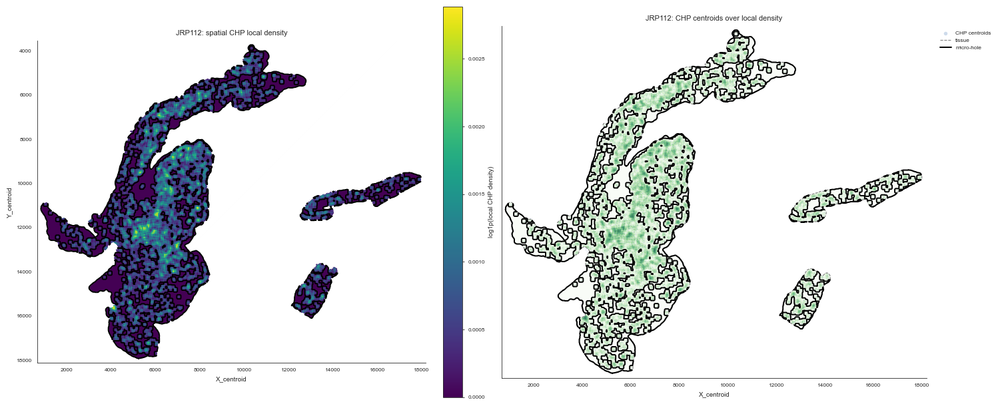

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_JRP122_spatial_chp_local_density_micro_holes.png


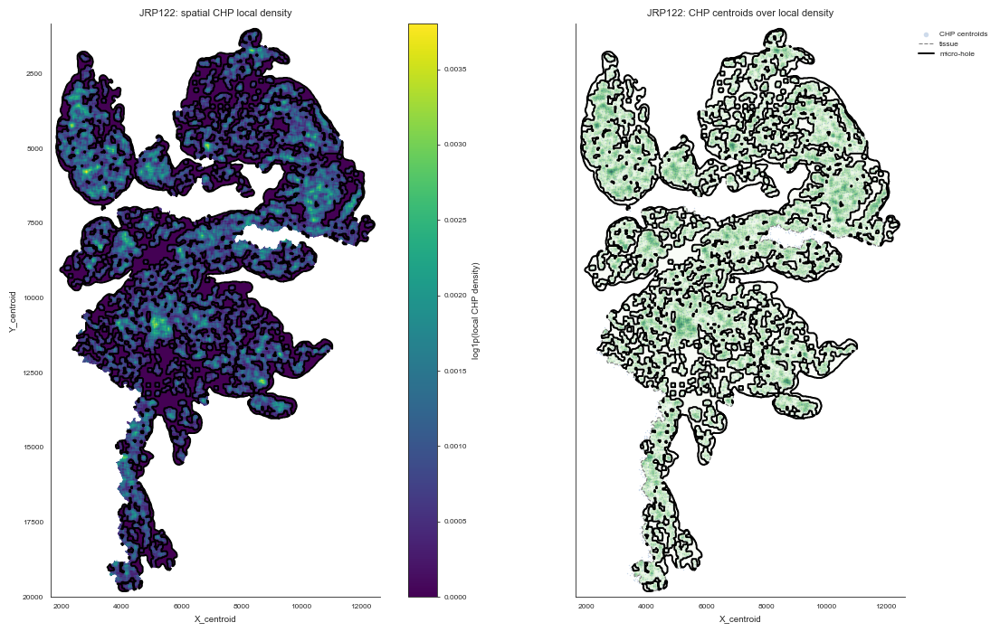

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_JRP141_spatial_chp_local_density_micro_holes.png


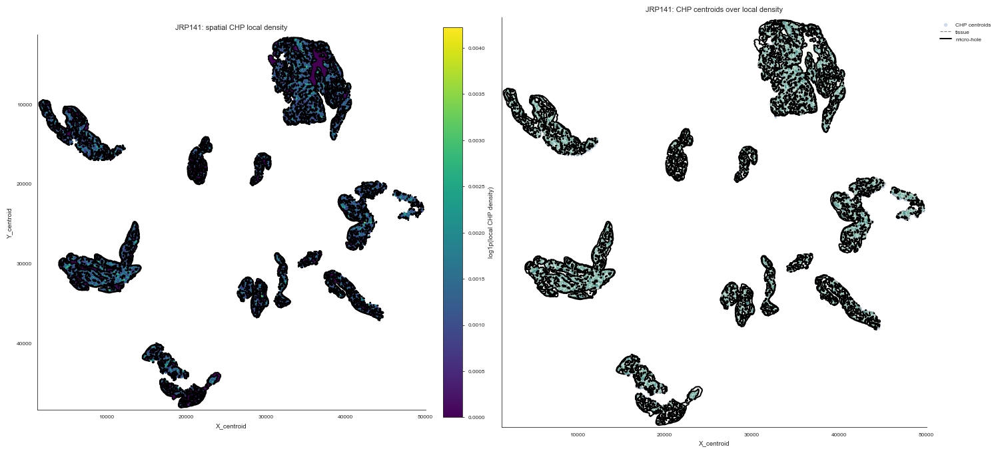

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_JRP144_spatial_chp_local_density_micro_holes.png


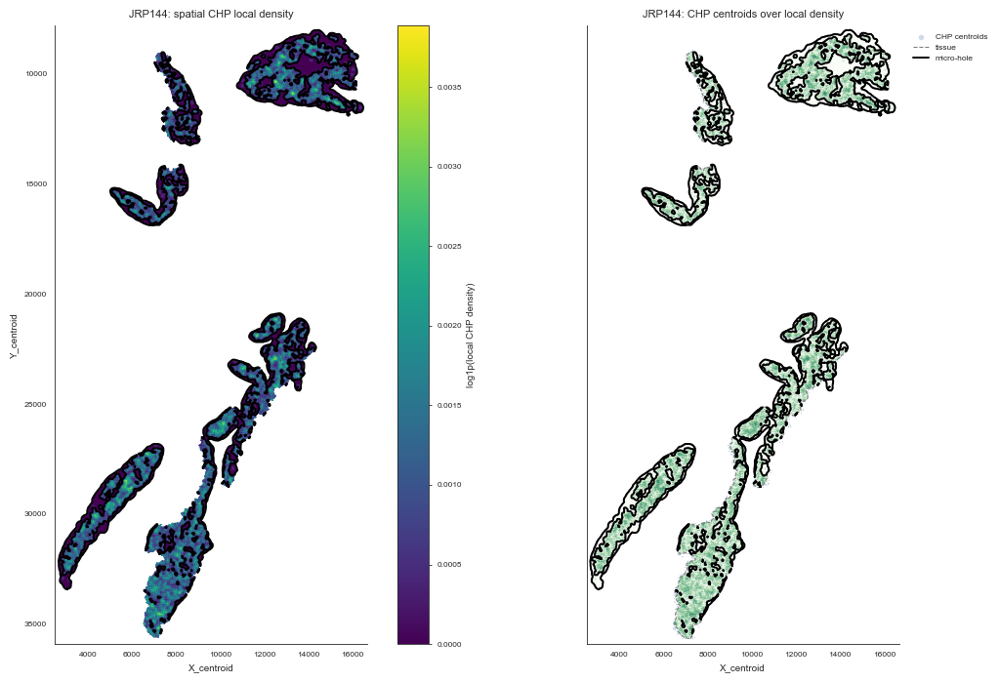

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_S00292623_spatial_chp_local_density_micro_holes.png


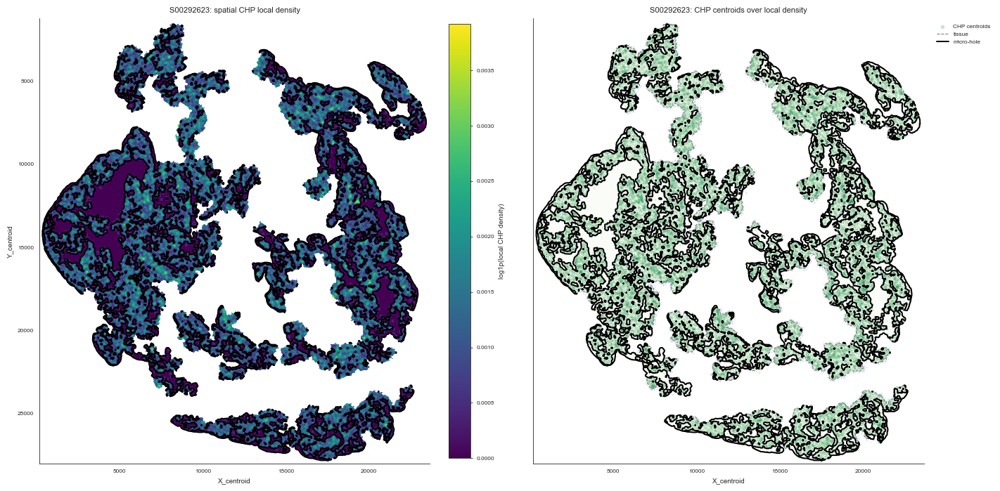

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_S00293087_spatial_chp_local_density_micro_holes.png


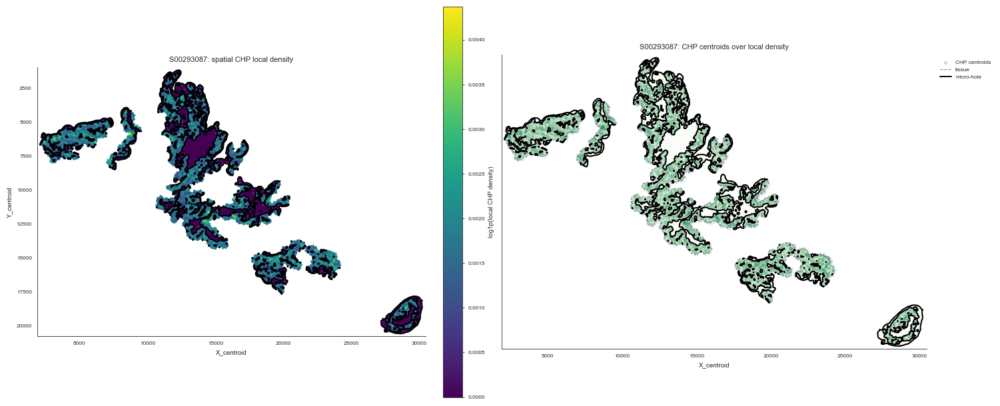

In [9]:
def plot_spatial_chp_local_density(image_maps, fiber_df, images=None, max_fibers=30000, log_scale=True):
    """
    Plot the spatial CHP local-density field used for micro-hole calling.

    This is not a separate model from the segmentation. It visualizes the same
    local-radius CHP density grid, which makes it easier to tune
    LOCAL_DENSITY_RADIUS_UM, DENSITY_SIGMA_UM, and CHP_LOW_DENSITY_RANK_CUTOFF.
    """
    if images is None:
        images = list(image_maps.keys())

    for image_id in images:
        if image_id not in image_maps:
            continue

        maps = image_maps[image_id]
        bounds = maps["bounds"]
        extent = [bounds["minx"], bounds["maxx"], bounds["maxy"], bounds["miny"]]
        tissue = maps["tissue_mask"].astype(bool)

        density = maps[f"{SEGMENTATION_FIBER_TYPE}_density"].astype(float)
        density_plot = np.where(tissue, density, np.nan)
        if log_scale:
            density_plot = np.log1p(density_plot)
            density_label = "log1p(local CHP density)"
        else:
            density_label = "local CHP density"

        chp_fibers = fiber_df[
            fiber_df[IMAGE_KEY].eq(image_id)
            & fiber_df[FIBER_TYPE_KEY].eq(SEGMENTATION_FIBER_TYPE)
        ].copy()
        if len(chp_fibers) > max_fibers:
            chp_fibers = chp_fibers.sample(max_fibers, random_state=0)

        fig, axes = plt.subplots(1, 2, figsize=(15, 7), sharex=True, sharey=True)

        im = axes[0].imshow(
            density_plot,
            extent=extent,
            cmap="viridis",
            interpolation="nearest",
        )
        plot_contours(axes[0], tissue, bounds, color="white", linewidth=0.9, linestyle="--", label="tissue")
        plot_contours(axes[0], maps["COL6_dark_mask"], bounds, color="black", linewidth=1.4, label="micro-hole")
        axes[0].set_title(f"{image_id}: spatial CHP local density")
        axes[0].set_xlabel(X_KEY)
        axes[0].set_ylabel(Y_KEY)
        fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04, label=density_label)

        axes[1].imshow(
            density_plot,
            extent=extent,
            cmap="Greens",
            interpolation="nearest",
            alpha=0.75,
        )
        axes[1].scatter(
            chp_fibers[X_KEY],
            chp_fibers[Y_KEY],
            s=1,
            color="#225ea8",
            alpha=0.22,
            linewidth=0,
            label="CHP centroids",
        )
        plot_contours(axes[1], tissue, bounds, color="gray", linewidth=0.8, linestyle="--", label="tissue")
        plot_contours(axes[1], maps["COL6_dark_mask"], bounds, color="black", linewidth=1.4, label="micro-hole")
        axes[1].set_title(f"{image_id}: CHP centroids over local density")
        axes[1].set_xlabel(X_KEY)
        axes[1].legend(bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False, markerscale=4)

        for ax in axes:
            ax.set_aspect("equal", adjustable="box")
            ax.invert_yaxis()
            ax.grid(False)

        fig.tight_layout()
        savefig(fig, f"05_{image_id}_spatial_chp_local_density_micro_holes.png")
        plt.show()


plot_spatial_chp_local_density(
    image_maps,
    fiber_run,
    images=qc_images,
)



## Smoothed CHP Density KDE QC

This plot shows the distribution of the smoothed CHP-density field inside the retained tissue mask. The vertical dashed line is the current density value corresponding to `CHP_LOW_DENSITY_RANK_CUTOFF`. Pixels called as micro-holes should sit mostly to the left of that line.


Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_JRP112_smoothed_chp_density_kde.png


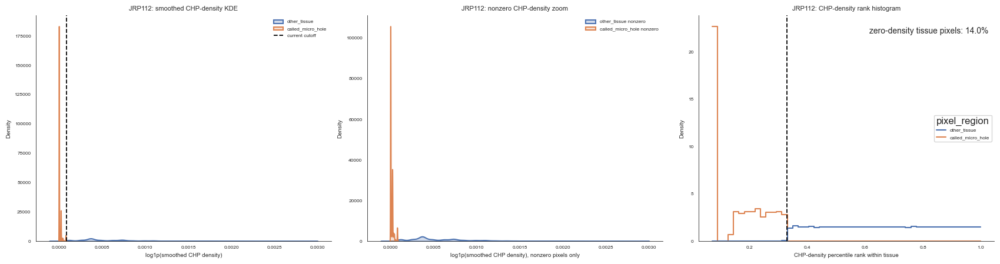

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_JRP122_smoothed_chp_density_kde.png


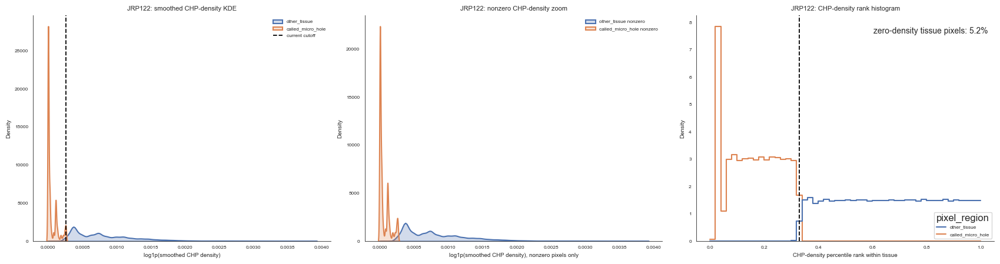

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_JRP141_smoothed_chp_density_kde.png


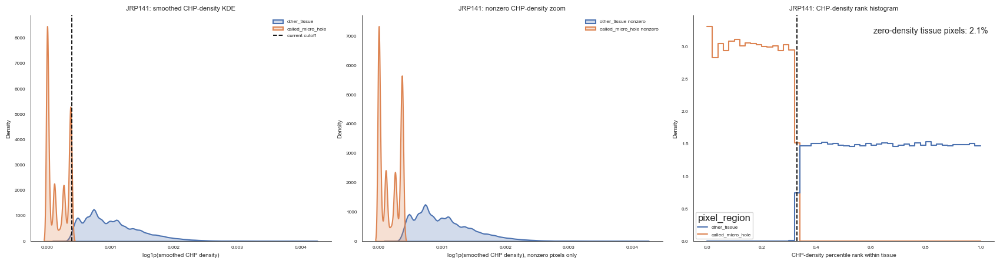

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_JRP144_smoothed_chp_density_kde.png


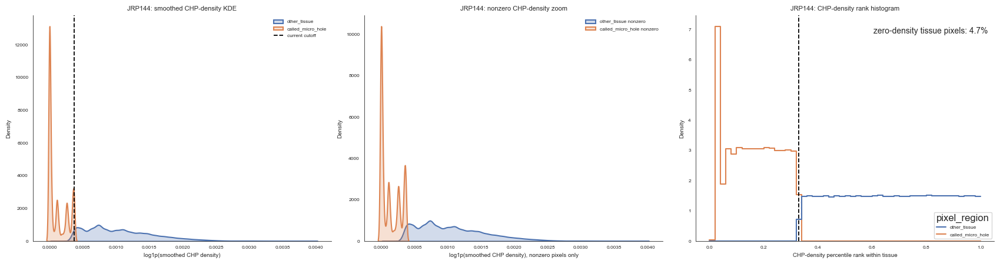

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_S00292623_smoothed_chp_density_kde.png


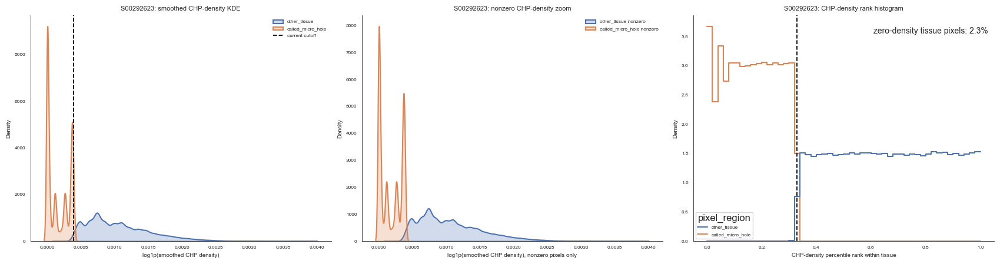

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/05_S00293087_smoothed_chp_density_kde.png


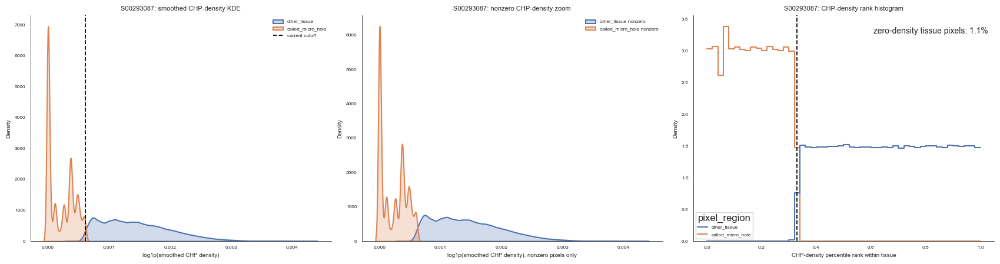

,imageid,smoothed_CHP_density,log1p_smoothed_CHP_density,CHP_density_rank,pixel_region,density_cutoff,log1p_density_cutoff,zero_density_fraction_in_tissue
0,JRP112,0.000368,0.000368,0.507348,other_tissue,0.000085,0.000085,0.13971
1,JRP112,0.000336,0.000336,0.462924,other_tissue,0.000085,0.000085,0.13971
2,JRP112,0.000627,0.000627,0.708757,other_tissue,0.000085,0.000085,0.13971
3,JRP112,0.000007,0.000007,0.260445,called_micro_hole,0.000085,0.000085,0.13971
4,JRP112,0.000259,0.000259,0.420561,other_tissue,0.000085,0.000085,0.13971


In [10]:
def _plot_kde_or_marker(ax, plot_df, x_col, palette, hue_order, label_suffix=""):
    """Use KDE when possible; fall back to a marker for tied/degenerate values."""
    for region in hue_order:
        vals = plot_df.loc[plot_df["pixel_region"].eq(region), x_col].dropna()
        if vals.empty:
            continue
        color = palette[region]
        label = f"{region}{label_suffix}"
        if vals.nunique() < 3:
            ax.axvline(vals.iloc[0], color=color, linewidth=2.0, alpha=0.8, label=f"{label} (tied)")
        else:
            sns.kdeplot(
                x=vals,
                color=color,
                fill=True,
                alpha=0.25,
                linewidth=1.5,
                label=label,
                ax=ax,
            )


def plot_smoothed_chp_density_kde(image_maps, images=None, max_pixels=250_000, random_state=0):
    """
    Plot smoothed CHP-density distributions inside tissue for segmentation QC.

    Interpretation
    --------------
    - The dashed vertical line is the current density cutoff implied by
      CHP_LOW_DENSITY_RANK_CUTOFF for that image.
    - At high grid resolution, many tissue pixels may have exactly zero CHP density;
      the rank histogram makes those ties visible.
    - If visually obvious holes are not in the low-density tail, lower smoothing or
      raise CHP_LOW_DENSITY_RANK_CUTOFF.
    """
    rng = np.random.default_rng(random_state)
    if images is None:
        images = list(image_maps.keys())

    kde_rows = []
    for image_id in images:
        if image_id not in image_maps:
            continue

        maps = image_maps[image_id]
        tissue = maps["tissue_mask"].astype(bool)
        chp_density = maps[f"{SEGMENTATION_FIBER_TYPE}_density"]
        chp_rank = maps["CHP_density_rank"]
        dark_mask = maps["COL6_dark_mask"].astype(bool)

        valid = tissue & np.isfinite(chp_density) & np.isfinite(chp_rank)
        rows, cols = np.where(valid)
        if len(rows) == 0:
            continue

        if len(rows) > max_pixels:
            keep = rng.choice(len(rows), size=max_pixels, replace=False)
            rows = rows[keep]
            cols = cols[keep]

        vals = chp_density[rows, cols]
        ranks = chp_rank[rows, cols]
        called = dark_mask[rows, cols]
        tissue_vals = chp_density[tissue]
        cutoff = np.nanquantile(tissue_vals, CHP_LOW_DENSITY_RANK_CUTOFF)
        zero_fraction = float(np.mean(tissue_vals == 0))

        kde_rows.append(pd.DataFrame({
            IMAGE_KEY: image_id,
            "smoothed_CHP_density": vals,
            "log1p_smoothed_CHP_density": np.log1p(vals),
            "CHP_density_rank": ranks,
            "pixel_region": np.where(called, "called_micro_hole", "other_tissue"),
            "density_cutoff": cutoff,
            "log1p_density_cutoff": np.log1p(cutoff),
            "zero_density_fraction_in_tissue": zero_fraction,
        }))

    kde_df = pd.concat(kde_rows, ignore_index=True) if kde_rows else pd.DataFrame()
    kde_df.to_csv(OUTPUT_DIR / "06_smoothed_chp_density_kde_pixels.csv", index=False)

    if kde_df.empty:
        print("No tissue pixels available for CHP-density KDE QC.")
        return kde_df

    palette = {
        "other_tissue": "#4c72b0",
        "called_micro_hole": "#dd8452",
    }
    hue_order = ["other_tissue", "called_micro_hole"]

    for image_id, plot_df in kde_df.groupby(IMAGE_KEY, observed=True):
        cutoff = plot_df["log1p_density_cutoff"].iloc[0]
        rank_cutoff = CHP_LOW_DENSITY_RANK_CUTOFF
        zero_fraction = plot_df["zero_density_fraction_in_tissue"].iloc[0]

        fig, axes = plt.subplots(1, 3, figsize=(17, 4.5))

        _plot_kde_or_marker(
            axes[0],
            plot_df,
            "log1p_smoothed_CHP_density",
            palette,
            hue_order,
        )
        axes[0].axvline(cutoff, color="black", linestyle="--", linewidth=1.3, label="current cutoff")
        axes[0].set_title(f"{image_id}: smoothed CHP-density KDE")
        axes[0].set_xlabel("log1p(smoothed CHP density)")
        axes[0].set_ylabel("Density")
        axes[0].legend(frameon=False)

        nonzero_df = plot_df[plot_df["smoothed_CHP_density"] > 0].copy()
        _plot_kde_or_marker(
            axes[1],
            nonzero_df,
            "log1p_smoothed_CHP_density",
            palette,
            hue_order,
            label_suffix=" nonzero",
        )
        axes[1].set_title(f"{image_id}: nonzero CHP-density zoom")
        axes[1].set_xlabel("log1p(smoothed CHP density), nonzero pixels only")
        axes[1].set_ylabel("Density")
        axes[1].legend(frameon=False)

        sns.histplot(
            data=plot_df,
            x="CHP_density_rank",
            hue="pixel_region",
            hue_order=hue_order,
            palette=palette,
            bins=50,
            stat="density",
            common_norm=False,
            element="step",
            fill=False,
            linewidth=1.5,
            ax=axes[2],
        )
        axes[2].axvline(rank_cutoff, color="black", linestyle="--", linewidth=1.3)
        axes[2].set_title(f"{image_id}: CHP-density rank histogram")
        axes[2].set_xlabel("CHP-density percentile rank within tissue")
        axes[2].set_ylabel("Density")
        axes[2].text(
            0.98,
            0.95,
            f"zero-density tissue pixels: {zero_fraction:.1%}",
            ha="right",
            va="top",
            transform=axes[2].transAxes,
            fontsize=10,
        )

        for ax in axes:
            sns.despine(ax=ax)
        fig.tight_layout()
        savefig(fig, f"05_{image_id}_smoothed_chp_density_kde.png")
        plt.show()

    return kde_df


chp_density_kde_pixels = plot_smoothed_chp_density_kde(
    image_maps,
    images=qc_images,
)
display(chp_density_kde_pixels.head())




## Edge-density comparison

Because micro-holes are called from CHP density only, the key checks are:

- Is smoothed CHP density low in the micro-hole core?
- Does CHP increase from core to inner/outer edge?
- Is COL6A1 also lower in the CHP-defined core, even though it was not used for segmentation?

For CHP, smoothed density metrics are more informative than raw centroid counts because the original fiber length is not represented in the centroid map.


,imageid,pathology,dark_component,region,value,fiber_type,metric
0,JRP112,RA,all,core,1030.877189,COL6A1,fiber_count_density_per_mm2
1,JRP112,RA,all,inner_edge,1001.879021,COL6A1,fiber_count_density_per_mm2
2,JRP112,RA,all,outer_edge,1268.655059,COL6A1,fiber_count_density_per_mm2
3,JRP112,RA,all,full_edge,1132.268499,COL6A1,fiber_count_density_per_mm2
4,JRP112,RA,all,background,1430.694359,COL6A1,fiber_count_density_per_mm2


Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/03_chp_micro_hole_region_edge_fiber_density_summary.png


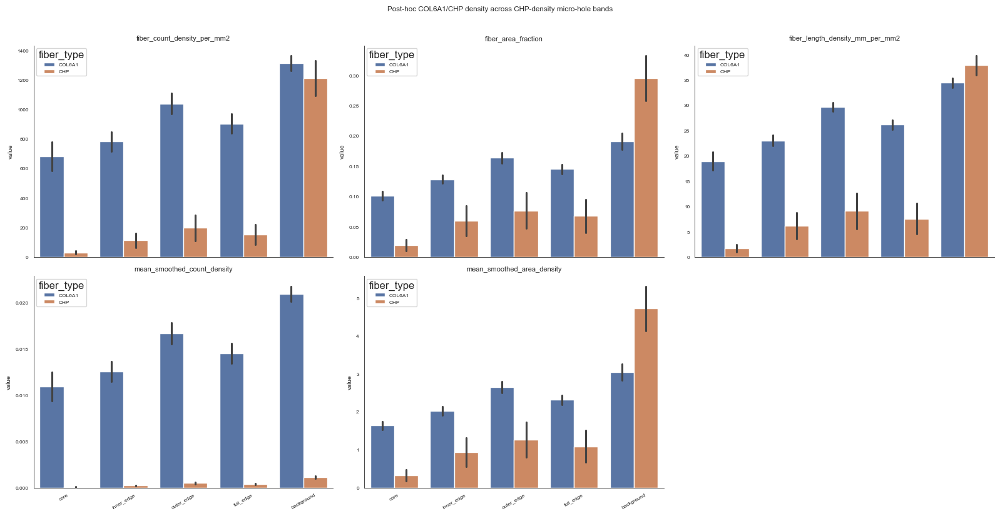

In [11]:
if not image_region_metrics.empty:
    region_order = ["core", "inner_edge", "outer_edge", "full_edge", "background"]
    image_region_metrics["region"] = pd.Categorical(image_region_metrics["region"], categories=region_order, ordered=True)

    density_metrics = [
        "fiber_count_density_per_mm2",
        "fiber_area_fraction",
        "fiber_length_density_mm_per_mm2",
        "mean_smoothed_count_density",
        "mean_smoothed_area_density",
    ]
    density_long = []
    for fiber_type in FIBER_TYPES:
        for metric in density_metrics:
            col = f"{fiber_type}_{metric}"
            if col in image_region_metrics.columns:
                tmp = image_region_metrics[[IMAGE_KEY, GROUP_KEY, "dark_component", "region", col]].copy()
                tmp["fiber_type"] = fiber_type
                tmp["metric"] = metric
                tmp = tmp.rename(columns={col: "value"})
                density_long.append(tmp)
    density_long = pd.concat(density_long, ignore_index=True) if density_long else pd.DataFrame()
    density_long.to_csv(OUTPUT_DIR / "05_image_region_edge_fiber_density_long.csv", index=False)
    display(density_long.head())

    fig, axes = plt.subplots(2, 3, figsize=(16, 8), sharex=True)
    axes = axes.ravel()
    for ax, metric in zip(axes, density_metrics):
        plot_df = density_long[density_long["metric"].eq(metric)].copy()
        sns.barplot(
            data=plot_df,
            x="region",
            y="value",
            hue="fiber_type",
            order=region_order,
            errorbar="se",
            ax=ax,
        )
        ax.set_title(metric)
        ax.set_xlabel("")
        ax.tick_params(axis="x", rotation=30)
        sns.despine(ax=ax)
    axes[-1].axis("off")
    fig.suptitle("Post-hoc COL6A1/CHP density across CHP-density micro-hole bands", y=1.02)
    fig.tight_layout()
    savefig(fig, "03_chp_micro_hole_region_edge_fiber_density_summary.png")
    plt.show()

## QC plots

The density QC plot shows cell density, CHP density, low-CHP score, and the final micro-hole mask. The overlay plot shows assigned cells plus CHP and COL6A1 fiber centroids.


Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/01_JRP112_chp_micro_hole_density_rank_score.png


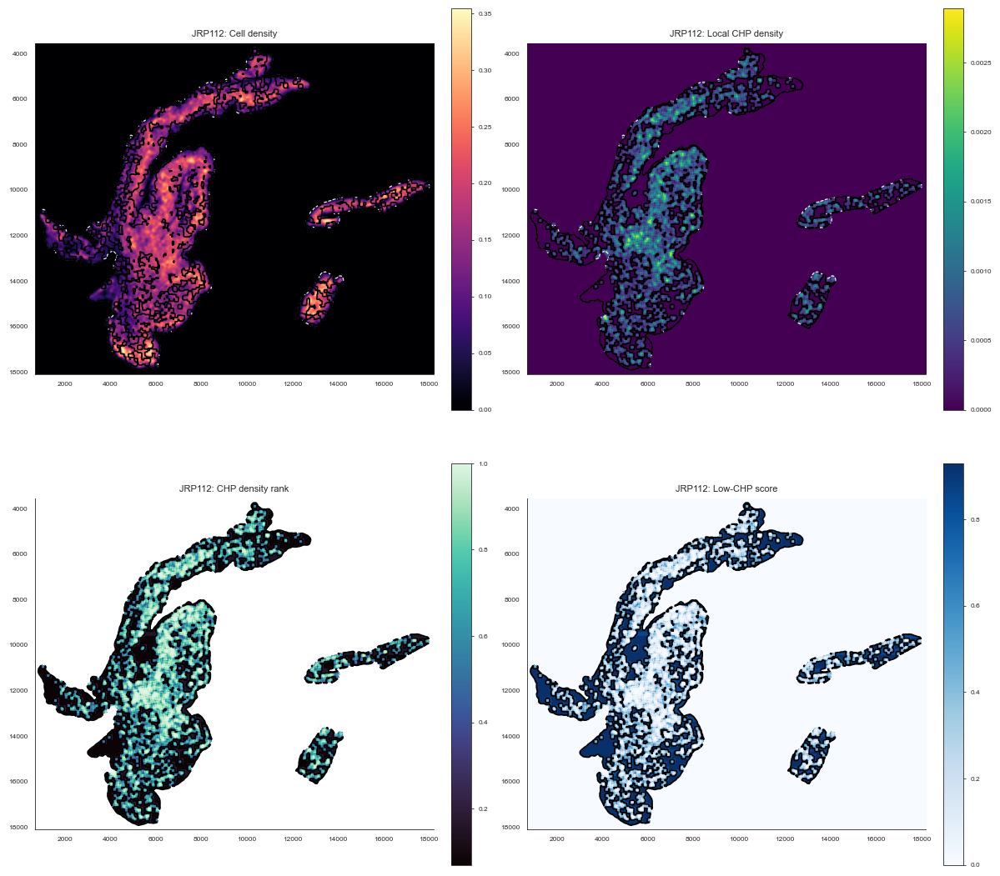

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/02_JRP112_chp_micro_hole_core_edge_overlay.png


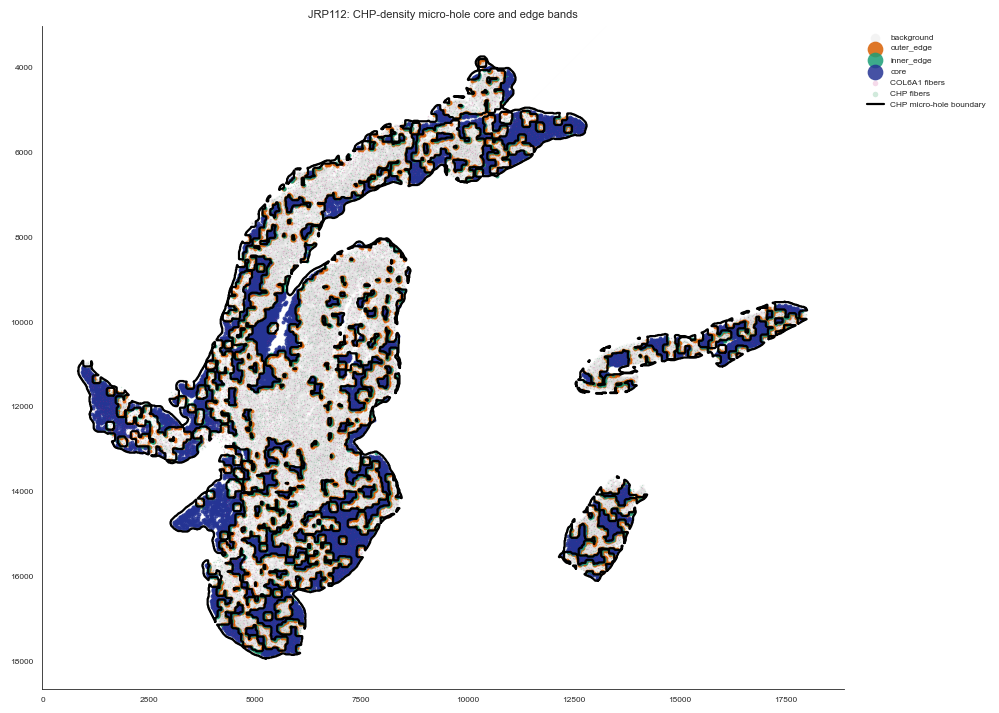

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/01_JRP122_chp_micro_hole_density_rank_score.png


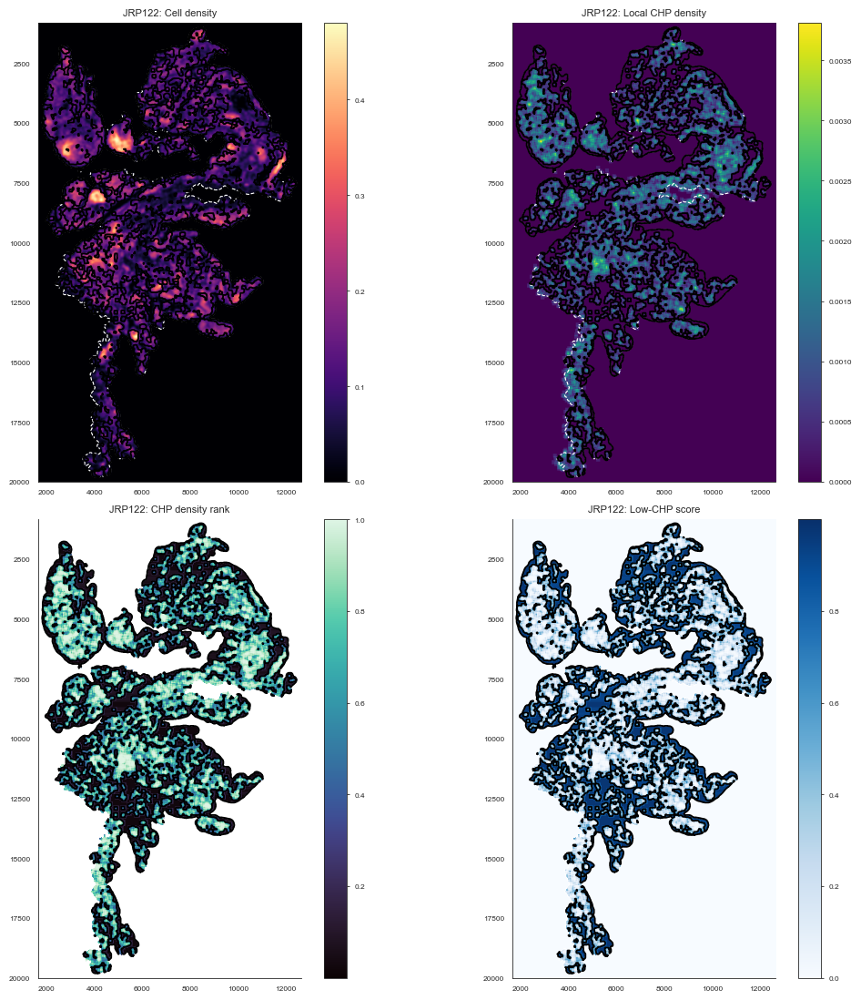

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/02_JRP122_chp_micro_hole_core_edge_overlay.png


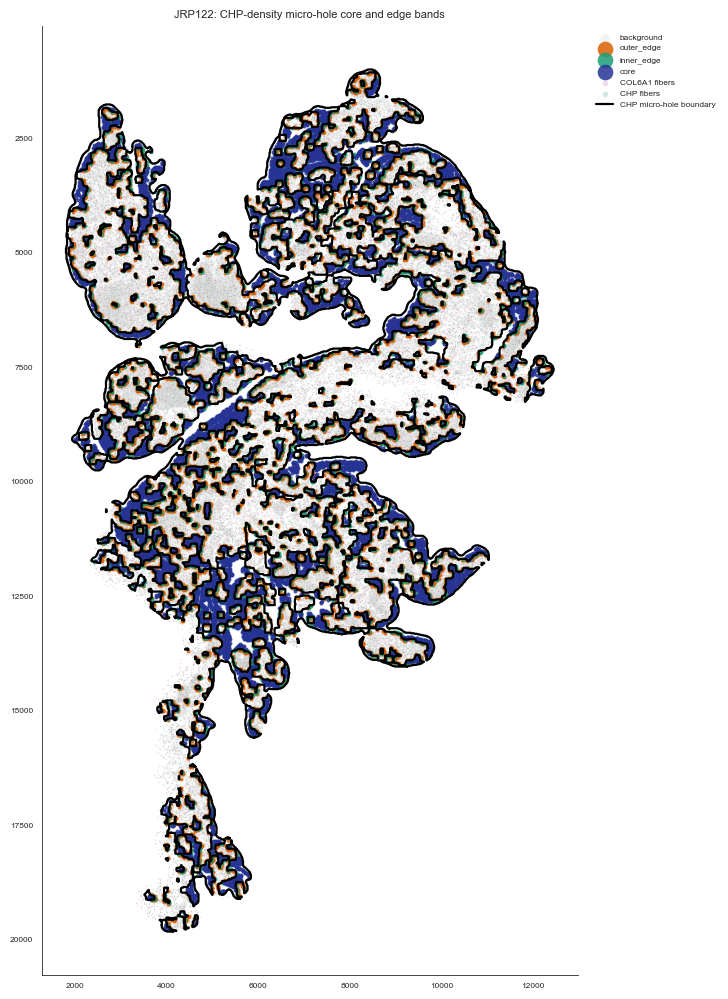

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/01_JRP141_chp_micro_hole_density_rank_score.png


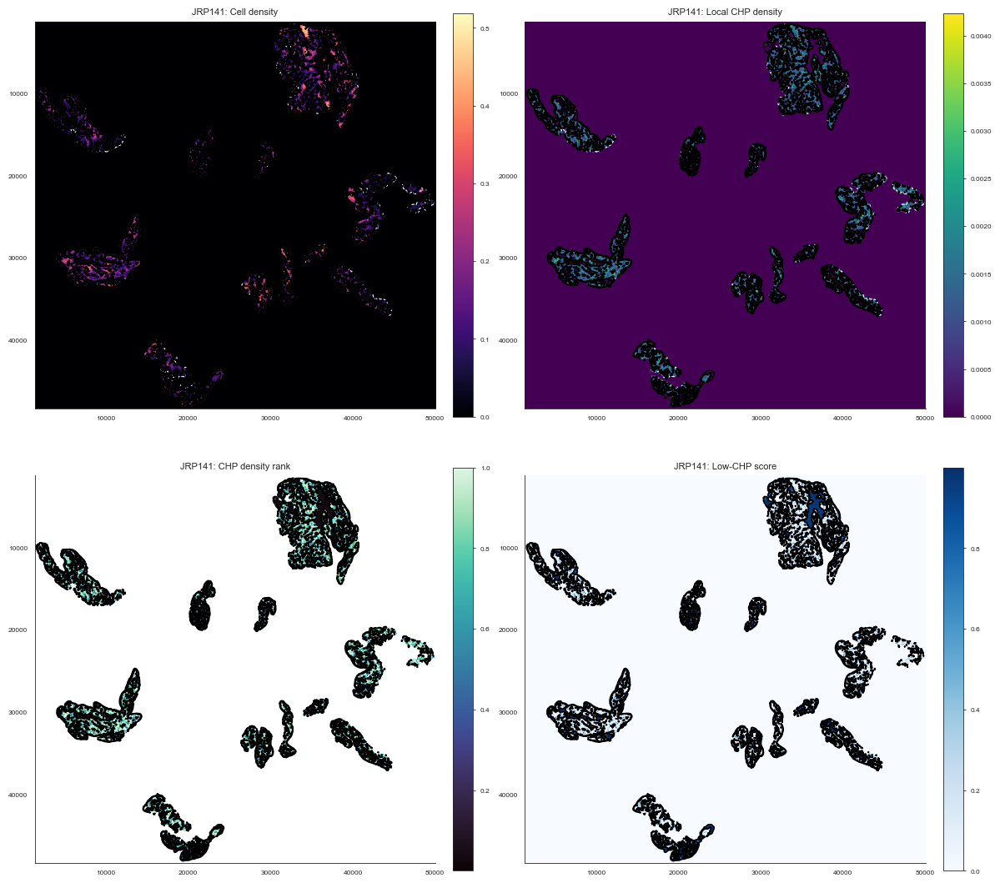

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/02_JRP141_chp_micro_hole_core_edge_overlay.png


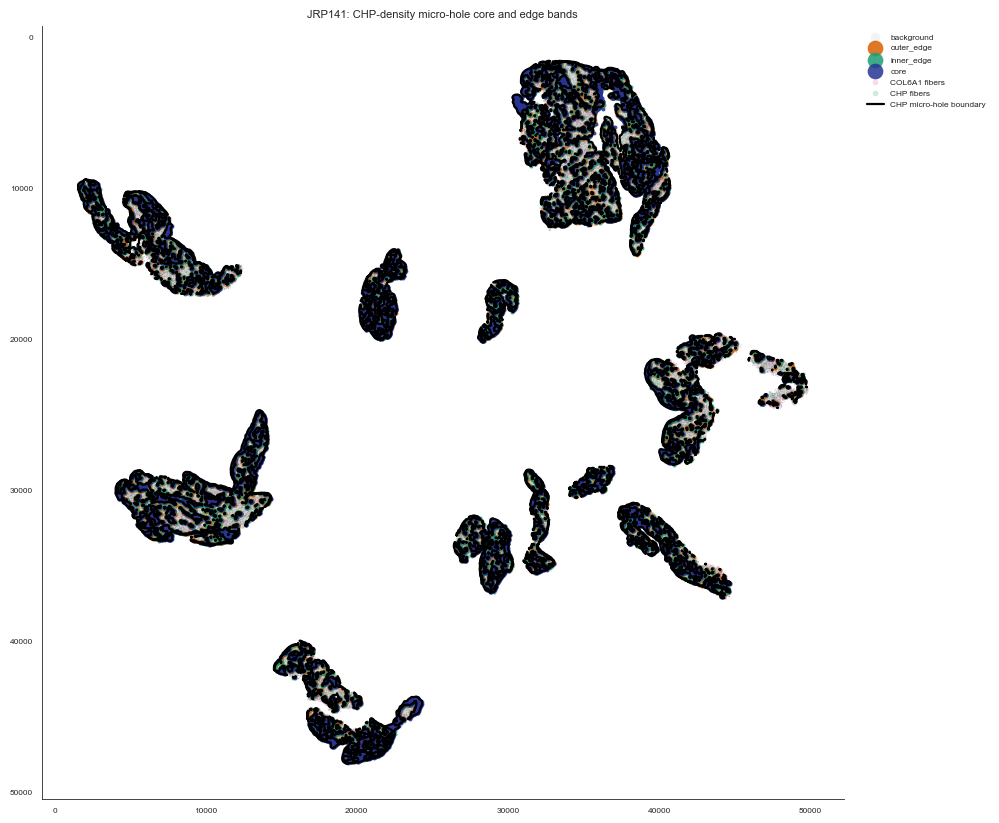

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/01_JRP144_chp_micro_hole_density_rank_score.png


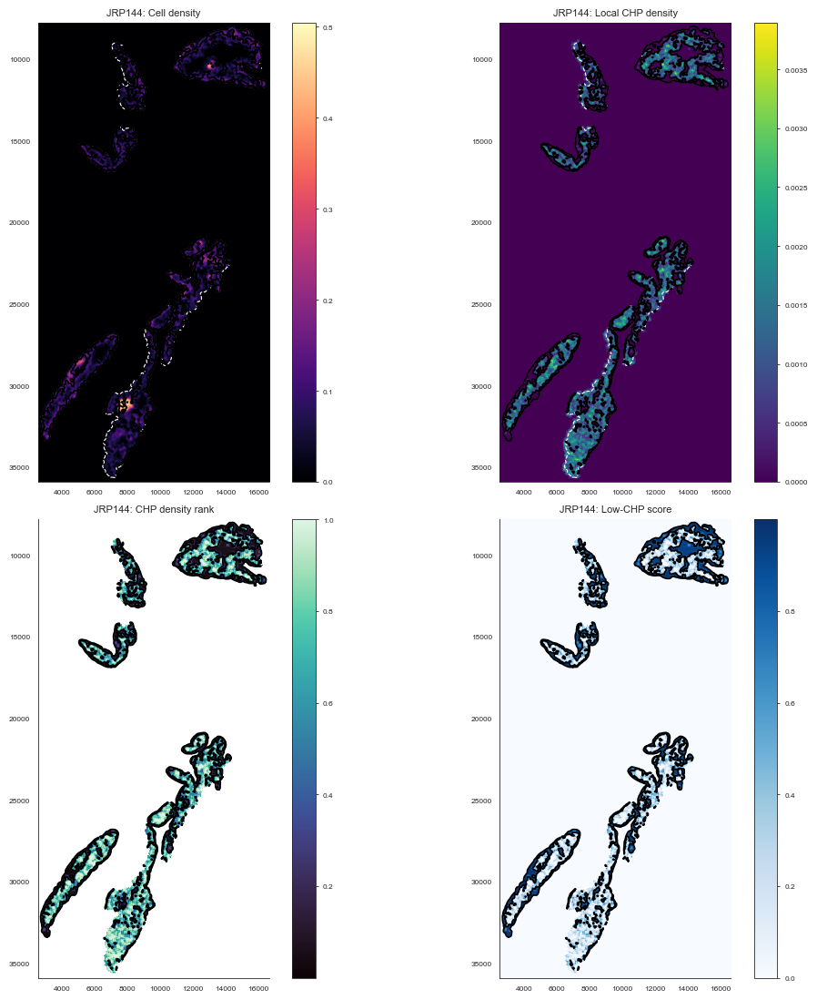

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/02_JRP144_chp_micro_hole_core_edge_overlay.png


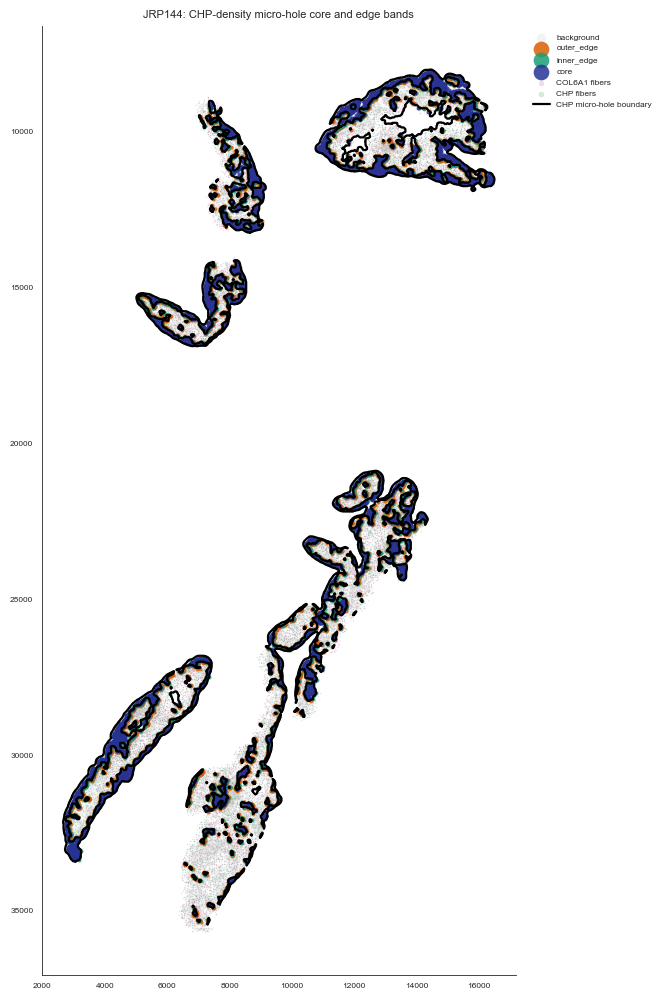

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/01_S00292623_chp_micro_hole_density_rank_score.png


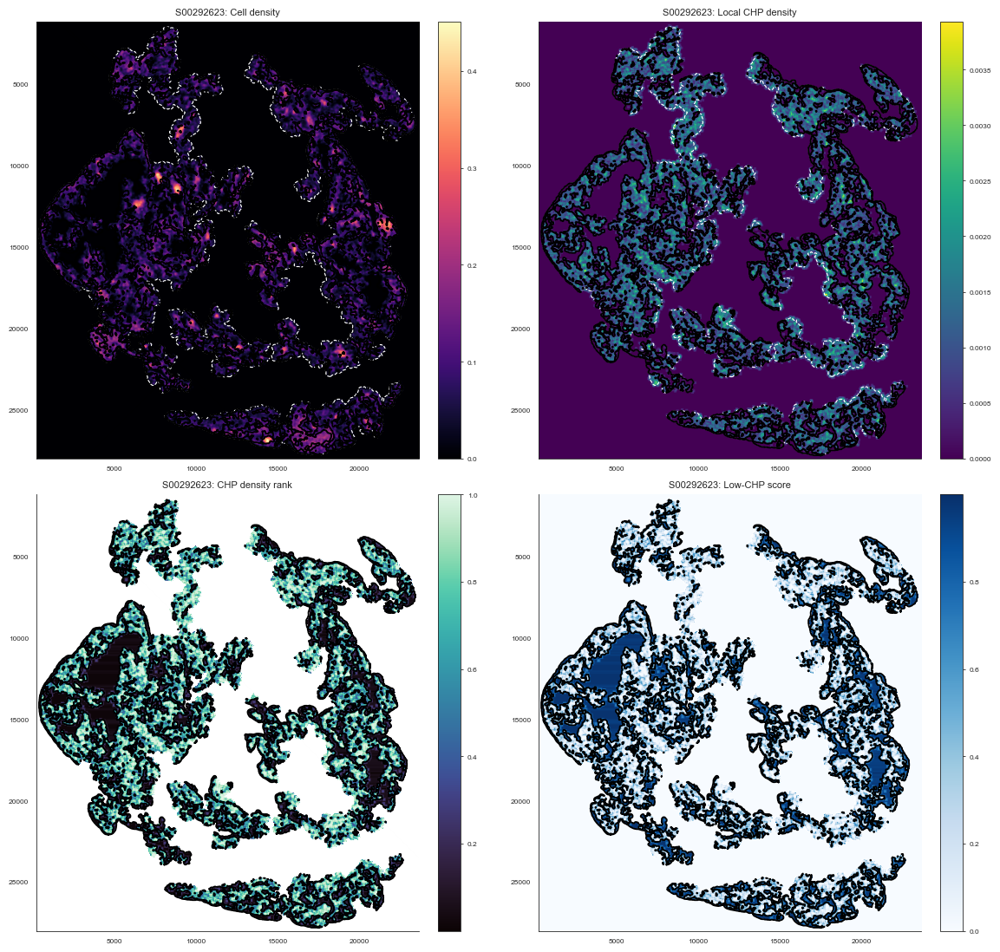

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/02_S00292623_chp_micro_hole_core_edge_overlay.png


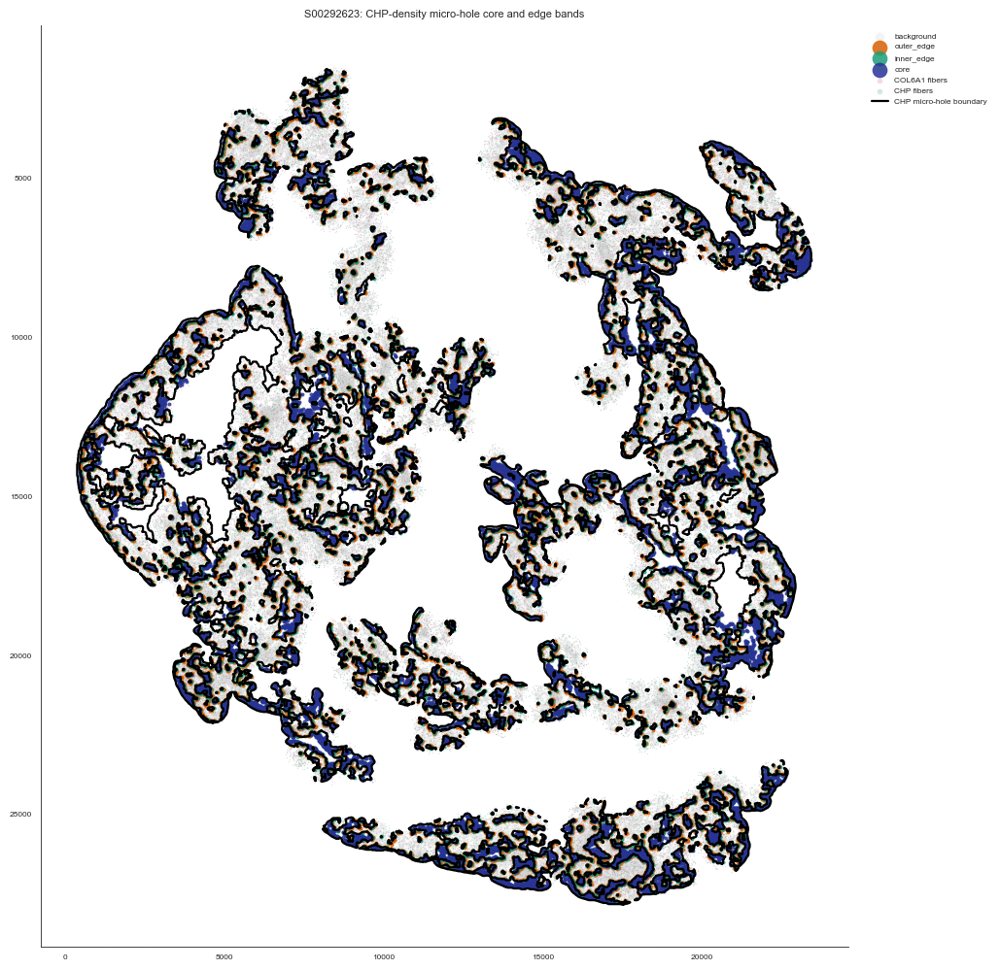

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/01_S00293087_chp_micro_hole_density_rank_score.png


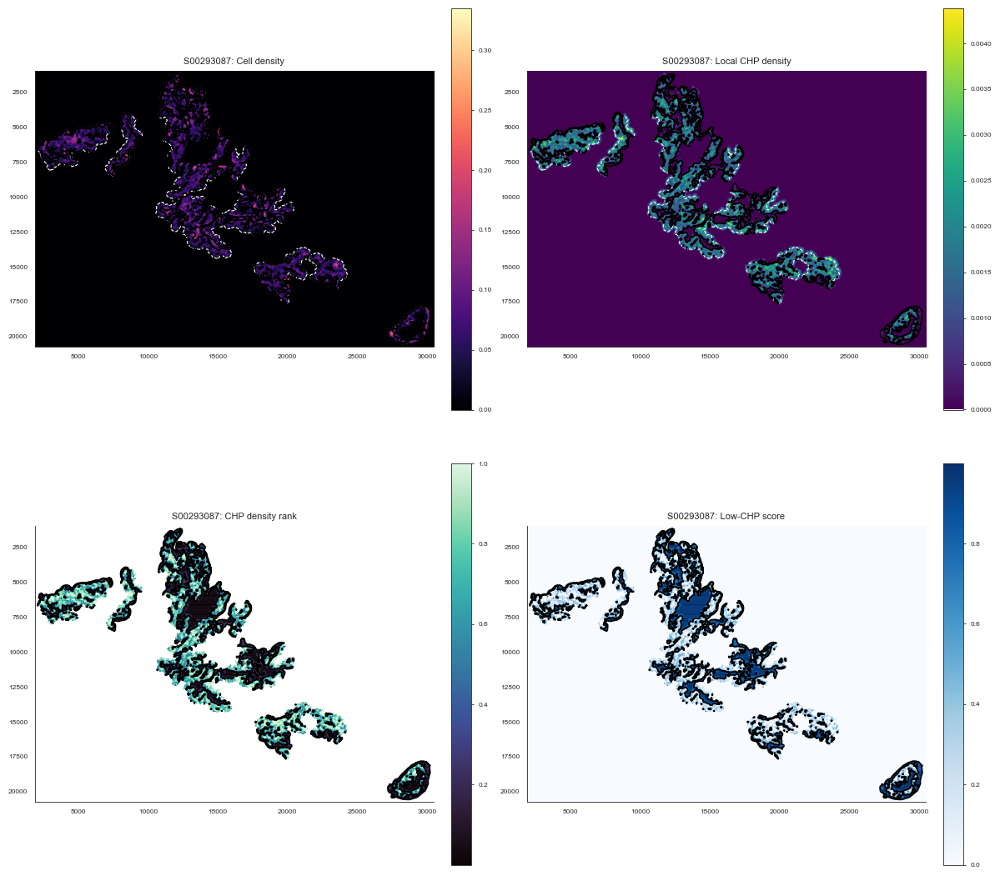

Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/02_S00293087_chp_micro_hole_core_edge_overlay.png


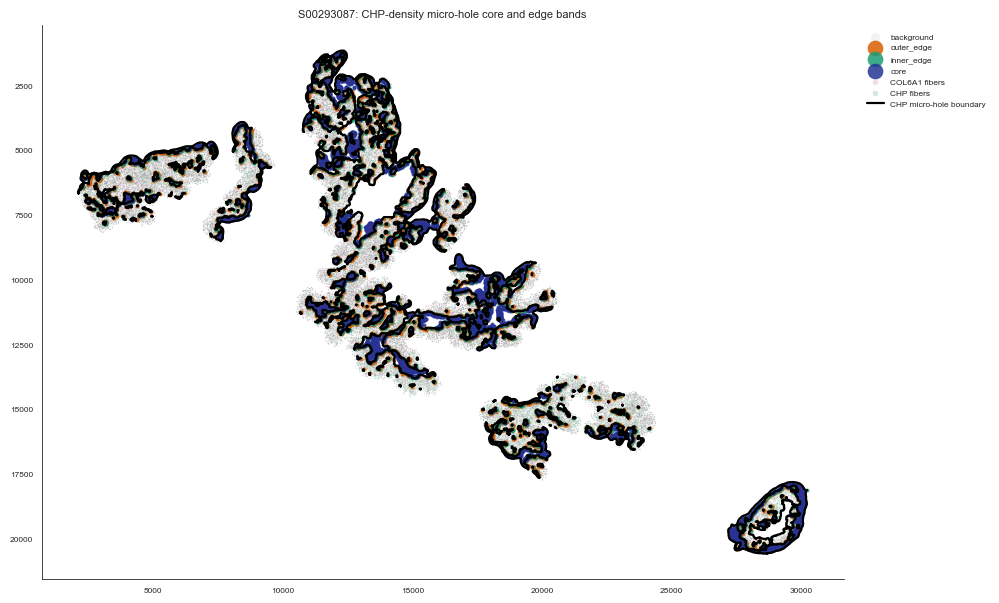

In [12]:
for image_id in qc_images:
    maps = image_maps[image_id]
    plot_density_qc(maps, image_id)
    plot_region_overlay(
        adata_run.obs,
        fiber_run,
        cell_region_assignments,
        maps,
        image_id,
    )


## Cell composition in dark-zone regions

After the geometric/fiber-density definition is set, this table lets us ask which cell phenotypes occupy the core, inner edge, outer edge, or background.

,imageid,pathology,phenotype,COL6_dark_region,n_cells,fraction_of_phenotype
0,JRP112,RA,B cells,background,321,0.746512
1,JRP112,RA,B cells,core,51,0.118605
2,JRP112,RA,B cells,inner_edge,26,0.060465
3,JRP112,RA,B cells,outer_edge,32,0.074419
4,JRP112,RA,CD4 T cells,background,7271,0.617967


Saved: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/figures/04_cell_phenotype_fraction_by_chp_micro_hole_region.png


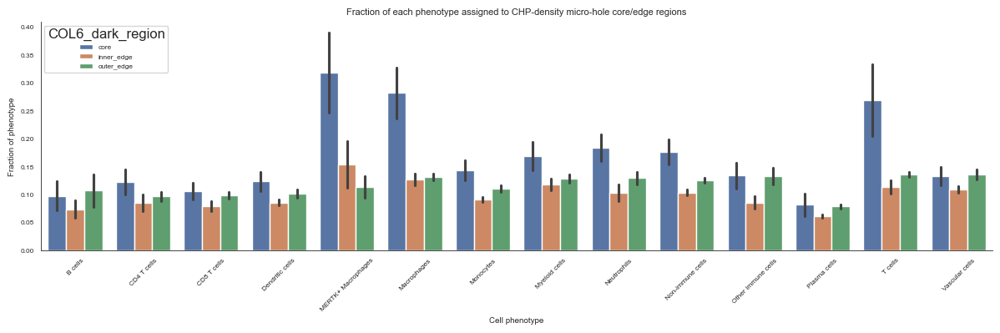

In [13]:
# ── Cell composition in dark-zone regions ───────────────────────────────────
# [reason] Which immune and stromal cell types accumulate inside COL6 dark zones?
# Compare region fractions across RA vs OA to identify disease-specific enrichment.
if not cell_region_assignments.empty:
    cell_region_counts = (
        cell_region_assignments
        .groupby([IMAGE_KEY, GROUP_KEY, PHENOTYPE_KEY, "COL6_dark_region"], observed=True)
        .size()
        .reset_index(name="n_cells")
    )
    totals = cell_region_counts.groupby([IMAGE_KEY, GROUP_KEY, PHENOTYPE_KEY], observed=True)["n_cells"].transform("sum")
    cell_region_counts["fraction_of_phenotype"] = cell_region_counts["n_cells"] / totals
    cell_region_counts.to_csv(OUTPUT_DIR / "06_cell_region_phenotype_counts.csv", index=False)
    display(cell_region_counts.head())

    plot_df = cell_region_counts[cell_region_counts["COL6_dark_region"].isin(["core", "inner_edge", "outer_edge"])].copy()
    fig, ax = plt.subplots(figsize=(12, 4))
    sns.barplot(
        data=plot_df,
        x=PHENOTYPE_KEY,
        y="fraction_of_phenotype",
        hue="COL6_dark_region",
        errorbar="se",
        ax=ax,
    )
    ax.set_title("Fraction of each phenotype assigned to CHP-density micro-hole core/edge regions")
    ax.set_xlabel("Cell phenotype")
    ax.set_ylabel("Fraction of phenotype")
    ax.tick_params(axis="x", rotation=45)
    sns.despine(ax=ax)
    fig.tight_layout()
    savefig(fig, "04_cell_phenotype_fraction_by_chp_micro_hole_region.png")
    plt.show()

## Score COL6-dark ECM-cell neighborhoods with sv.tl

`sv.tl.score_col6_dark_neighborhoods` takes the per-cell ECM-cell neighborhood
features (COL6A1 density, CHP density, local cell density) and labels neighborhoods
as COL6-dark using a transparent, rank-based rule — matching the biology from the
CHP density segmentation above.

This is the **package-level equivalent** of the custom raster segmentation: it
operates at the cell-neighborhood granularity rather than the image grid, and is
reproducible with a single sv.tl function call.


In [14]:
# ── Build per-cell ECM neighborhoods and score COL6-dark status ──────────────
# [reason] build_ecm_cell_neighborhood_features computes local ECM context for
# each cell (fiber densities, cell phenotype fractions within a radius). This
# is the sv.tl equivalent of the raster density map — cell-resolution instead
# of grid-resolution. score_col6_dark_neighborhoods then annotates neighborhoods
# where COL6A1 AND CHP density are both low inside the tissue.

_NEIGHBORHOOD_RADIUS_PX = 50 / PIXEL_SIZE_UM  # 50 µm

try:
    # Load links if available
    _links = links_tissue if "links_tissue" in dir() else links_selected
    _adata = adata_tissue if "adata_tissue" in dir() else adata_selected
    _fibers = fiber_tissue if "fiber_tissue" in dir() else fiber_selected

    neighborhood_df = build_ecm_cell_neighborhood_features(
        _adata,
        _fibers,
        _links,
        radius=_NEIGHBORHOOD_RADIUS_PX,
        phenotype_key=PHENOTYPE_KEY,
        image_key=IMAGE_KEY,
        group_key=GROUP_KEY,
        x_key=X_KEY,
        y_key=Y_KEY,
        fiber_type_key=FIBER_TYPE_KEY,
        fiber_types=["COL6A1", "CHP"],
        pixel_size_um=PIXEL_SIZE_UM,
    )
    print(f"ECM-cell neighborhood features: {neighborhood_df.shape}")

    # Cluster neighborhoods into K types (k=8 is a reasonable starting point)
    neighborhood_adata = cluster_ecm_cell_neighborhoods(
        neighborhood_df, n_clusters=8, random_state=42
    )
    neighborhood_df = neighborhood_df.copy()
    neighborhood_df["ecm_cell_neighborhood"] = neighborhood_adata.obs["ecm_cell_neighborhood"].values

    # Score COL6-dark neighborhoods
    neighborhood_df, dark_scores = score_col6_dark_neighborhoods(
        neighborhood_df,
        label_key="ecm_cell_neighborhood",
        col6_density_col="fiber_density_COL6A1",
        chp_density_col="fiber_density_CHP",
    )
    print("COL6-dark neighborhood scores:")
    display(dark_scores.sort_values("COL6_dark_neighborhood", ascending=False))

    neighborhood_df.to_csv(
        OUTPUT_DIR / "svtl_ecm_cell_neighborhood_dark_scores.csv", index=False
    )
    print("Saved neighborhood dark scores.")
except Exception as exc:
    print(f"Neighborhood scoring skipped: {exc}")


ECM-cell neighborhood features: (516185, 62)
Neighborhood scoring skipped: 'tuple' object has no attribute 'obs'


## Optional: write region labels back to AnnData

Keep this off while tuning. Once the micro-hole QC looks right, set `WRITE_ANNOTATED_H5AD = True` to save a copy with `COL6_dark_region`, `dark_component`, `COL6_dark_score`, and `CHP_density_rank` in `adata.obs`.


In [15]:
WRITE_ANNOTATED_H5AD = True

if WRITE_ANNOTATED_H5AD:
    adata_out = adata.copy()
    mapped = cell_region_assignments.set_index("cell_id")
    for col in ["COL6_dark_region", "dark_component", "COL6_dark_score", "CHP_density_rank"]:
        adata_out.obs[col] = adata_out.obs.index.map(mapped[col])
    out_path = OUTPUT_DIR / "07_RA_OA_cells_with_CHP_density_micro_holes.h5ad"
    adata_out.write_h5ad(out_path)
    print("Saved annotated AnnData:", out_path)

Saved annotated AnnData: /Users/shihongwu/SpatioEv/paper/notebooks/results/ra_oa_ecm_cell/chp_density_micro_holes_col6_dark_segmentation/outputs/07_RA_OA_cells_with_CHP_density_micro_holes.h5ad
